<a href="https://colab.research.google.com/github/mahmud-nobe/Cluster-Membership/blob/master/GMM/NGC_6823/NGC6823_GMM_version_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import Necessary Packages and download the csv files

#### Importing packages

In [ ]:
# import packages
import pandas as pd
#import pandas_profiling as pd_prof
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# for downloading file
#from google.colab import files

## Use random forest to create and evaluate new model
from sklearn.ensemble import RandomForestClassifier

In [ ]:
!pip install astroquery

     |████████████████████████████████| 4.4 MB 29.4 MB/s 
     |████████████████████████████████| 802 kB 37.6 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 3.0 MB 49.8 MB/s 
  Created wheel for mimeparse: filename=mimeparse-0.1.3-py3-none-any.whl size=3864 sha256=ca07d69f7d46d7288a449e24f46ec8f1ee8bd8752a6dcccabead34b6851c2140
  Stored in directory: /root/.cache/pip/wheels/49/b4/2d/0081759ae1833bd694024801f7aacddcda8a687e8d5fbaeebd
Successfully built mimeparse


In [ ]:
# import astroquery
import astropy.units as u
import astropy.coordinates as coord
from astroquery.gaia import Gaia
from astroquery.vizier import Vizier


#### Finding GAIA Data

In [ ]:
## making a GAIA cone_search of 30m radius around M67 center

coordinate = coord.SkyCoord.from_name('NGC6823')
print(coordinate)
radius = u.Quantity(0.5, u.deg)
Gaia.ROW_LIMIT = -1
# table = "gaiaedr3.gaia_source"
table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius, table_name=table)
r = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (295.7875, 23.3)>
INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [ ]:
#r = pd.read_csv('M_67_GAIA_DR2_1deg.csv')

In [ ]:
## save the ASCII table as a panadas dataframe
all_stars = r.to_pandas()
all_stars


,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,...,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist
0,1635721458409799680,Gaia DR2 2020089356027897984,2020089356027897984,460323388,2015.5,295.788262,0.348557,23.300483,0.300012,-0.481929,0.442188,-1.089874,-8.491635,0.821111,-8.999262,0.618153,0.046971,-0.359205,-0.072761,0.318171,0.179414,0.314828,-0.244340,0.136165,-0.361228,-0.070342,131,0,129,2,10.011535,356.572540,1.714725,10.394134,31,False,0.185658,1.433038,0.078069,0.041376,...,10,1711.930893,114.652780,14.931438,16.678204,3.449107,0,1.108465,-0.638451,1.746916,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,59.402627,-0.144372,303.600159,43.777841,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.000842
1,1635721458409799680,Gaia DR2 2020089356034969216,2020089356034969216,1536287709,2015.5,295.786467,0.293790,23.299823,0.265644,-0.392266,0.401268,-0.977567,1.953808,0.666258,-3.744219,0.552235,0.103655,-0.128643,0.313646,0.401738,0.423083,0.372998,0.168258,0.059869,0.118420,0.394597,165,0,161,4,16.851202,681.311401,1.802835,28.471491,31,False,0.220221,1.351326,0.068102,-0.071606,...,14,1928.413348,12.444485,154.961273,16.548920,1.915693,0,2.163383,0.759989,1.403395,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,59.401234,-0.143270,303.597723,43.777595,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.000972
2,1635721458409799680,Gaia DR2 2020089356027626496,2020089356027626496,1548515625,2015.5,295.786368,6.544765,23.299976,2.042477,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.951312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79,0,79,0,3.053328,116.801094,1.982713,2.455494,3,False,0.076799,NaN,NaN,0.254767,...,0,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,59.401321,-0.143115,303.597651,43.777765,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.001046
3,1635721458409799680,Gaia DR2 2020089351728656384,2020089351728656384,1580774310,2015.5,295.788384,0.189041,23.301521,0.206388,-1.985408,0.256101,-7.752450,-1.505254,0.374015,-3.534351,0.358244,0.092227,0.072633,-0.463353,-0.004710,0.350887,-0.060783,-0.435308,-0.190400,-0.251565,0.011754,221,186,221,0,78.299789,9344.104492,1.144950,301.551276,31,False,0.745399,1.642257,0.064160,0.051443,...,16,104315.035754,157.473075,662.430908,12.216053,1.258858,0,0.968729,0.371762,0.596967,NaN,NaN,0,NaN,NaN,NaN,NOT_AVAILABLE,59.403582,-0.143953,303.600654,43.778821,110001,5237.946777,4950.00,5365.0,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,https://gea.esac.esa.int/data-server/datalink/...,0.001715
4,1635721458409799680,Gaia DR2 2020089356028193024,2020089356028193024,1020837176,2015.5,295.788025,0.349028,23.2983

In [ ]:
#all_stars.to_csv('M_67_GAIA_DR2_1deg.csv')

#files.download('M_67_GAIA_DR2_1deg.csv')

##### Applying Filter:

In [ ]:
#all_stars['pmra_over_error'] = abs(all_stars['pmra']/all_stars['pmra_error'])
#all_stars['pmdec_over_error'] = abs(all_stars['pmdec']/all_stars['pmdec_error'])

In [ ]:
all_stars['g_mag_error'] = 2.5/np.log(10) / all_stars.phot_g_mean_flux_over_error

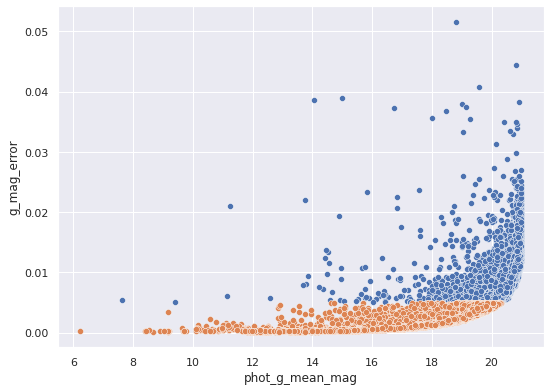

In [ ]:
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.g_mag_error)
mask = all_stars.g_mag_error <= 0.005
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].g_mag_error)

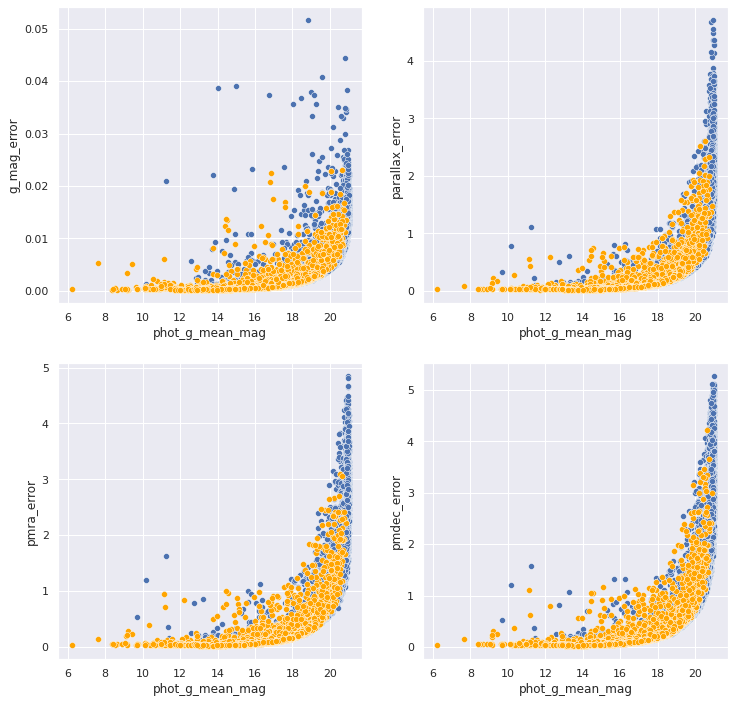

In [ ]:
plt.figure(figsize = (12,12))

mask = all_stars.parallax_over_error >= 5

plt.subplot(221)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.g_mag_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].g_mag_error, color = 'orange')

plt.subplot(222)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.parallax_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].parallax_error, color = 'orange')

plt.subplot(223)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmra_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmra_error, color = 'orange')

plt.subplot(224)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmdec_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmdec_error, color = 'orange')

In [ ]:
#all_stars_filtered = all_stars_filtered[(all_stars_filtered.pmra_error < 0.3) & (all_stars_filtered.pmdec_error < 0.3)]

In [ ]:
#all_stars_filtered.shape

##### Visualizing GAIA data

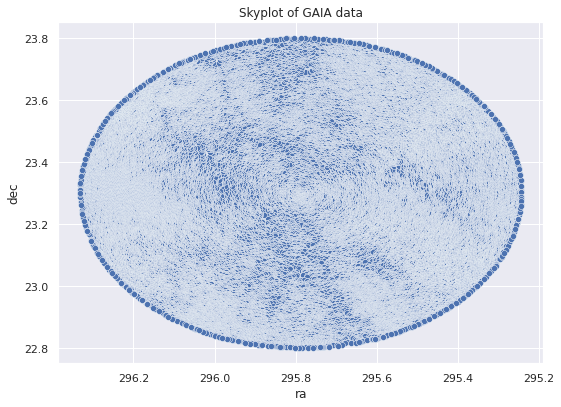

In [ ]:
## plotting the skyplot 

sns.set(rc={'figure.figsize':(8.7,6.27)})

skyplot = sns.scatterplot(x='ra', y='dec', data = all_stars)
skyplot.invert_xaxis()
plt.title('Skyplot of GAIA data')
plt.show()

In [ ]:
all_stars = all_stars[all_stars['parallax'] >= 0]
print(len(all_stars))

all_stars = all_stars[all_stars.loc[:, 'pmra'].notnull()]
print(len(all_stars))

all_stars = all_stars[all_stars.loc[:, 'bp_rp'].notnull()]
print(len(all_stars))

54629
54629
51568


In [ ]:
all_stars['distance_pc'] = 1/(all_stars.parallax*0.001)

In [ ]:
const = 1.5 * 10**8 / (365*24*3600)
const

4.756468797564688

In [ ]:
## tangential velocity = 4.74 * pm / p(")

cos_delta = np.cos(np.deg2rad(all_stars.dec))

all_stars['velocity_ra'] = const * all_stars.pmra * cos_delta * (10**-3) / (all_stars.parallax * 10**(-3))
all_stars['velocity_dec'] = const * all_stars.pmdec * (10**-3) / (all_stars.parallax * 10**(-3))

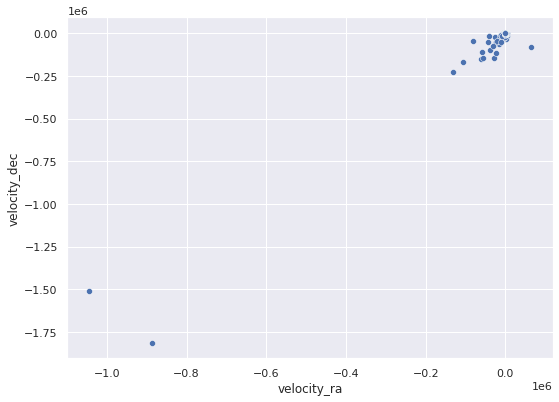

In [ ]:
sns.scatterplot(x='velocity_ra', y='velocity_dec', data = all_stars)
plt.show()

In [ ]:
all_stars.loc[:, ['velocity_ra', 'velocity_dec']].describe()

,velocity_ra,velocity_dec
count,5.156800e+04,5.156800e+04
mean,-1.033020e+02,-2.242902e+02
std,6.134546e+03,1.061565e+04
min,-1.044054e+06,-1.814000e+06
25%,-3.604010e+01,-8.274105e+01
50%,-1.522792e+01,-4.004831e+01
75%,-4.341865e+00,-1.761608e+01
max,6.364018e+04,2.203099e+03


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


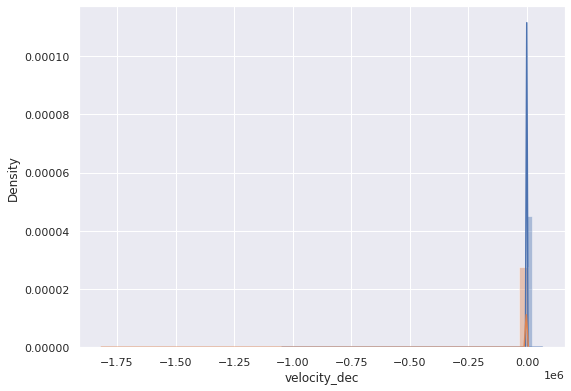

In [ ]:

sns.distplot(all_stars.velocity_ra)
sns.distplot(all_stars.velocity_dec)


In [ ]:
ra_mask = (all_stars.velocity_ra >= all_stars.velocity_ra.quantile(0.05)) & (all_stars.velocity_ra <= all_stars.velocity_ra.quantile(0.95))
dec_mask = (all_stars.velocity_dec >= all_stars.velocity_dec.quantile(0.05)) & (all_stars.velocity_dec <= all_stars.velocity_dec.quantile(0.95))
mask = ra_mask & dec_mask

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


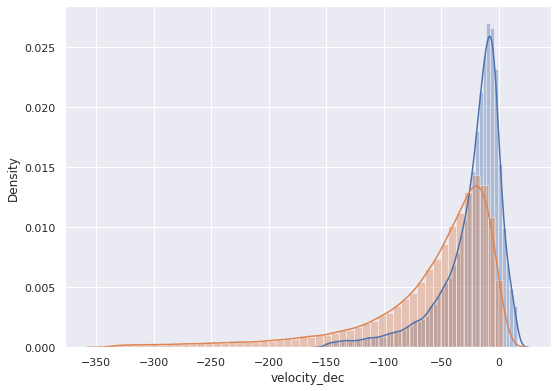

In [ ]:
sns.distplot(all_stars[ra_mask].velocity_ra)
sns.distplot(all_stars[dec_mask].velocity_dec)


-7.92456505592571 -19.31152641059471


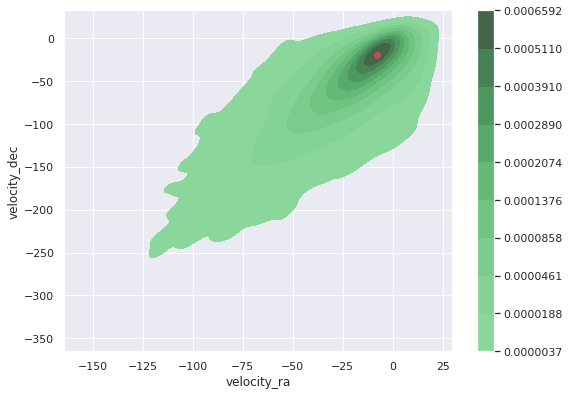

In [ ]:
#cbar_kws = { 'ticks' : np.linspace(0.01, 0.12, 8),
#                'label': 'Probability Density [(mas/year)$^{-2}$]'}

kde = sns.kdeplot(x='velocity_ra', y='velocity_dec', data =all_stars[mask], shade=True, color = 'g',
                      cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    v_ra_center, v_dec_center = (x,y)
plt.show()

In [ ]:
print(len(all_stars))

all_stars_filtered = all_stars[(abs(all_stars['pmra']) < 20) & (abs(all_stars['pmdec']) < 20)]
print(len(all_stars))

all_stars_filtered = all_stars[all_stars['dist'] < (60/60)]
print(len(all_stars))

all_stars_filtered = all_stars_filtered[((all_stars_filtered['distance_pc']) < 1200) & ((all_stars_filtered['distance_pc']) > 600)]
print(len(all_stars_filtered))


51568
51568
51568
11135


In [ ]:
all_stars.loc[:, ['velocity_ra', 'velocity_dec']].describe()

,velocity_ra,velocity_dec
count,11860.000000,11860.000000
mean,-14.083835,-38.777355
std,19.369273,27.368399
min,-158.846171,-184.325470
25%,-24.152246,-51.925695
50%,-14.564601,-38.519500
75%,-4.640974,-24.061434
max,124.577475,113.134404


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


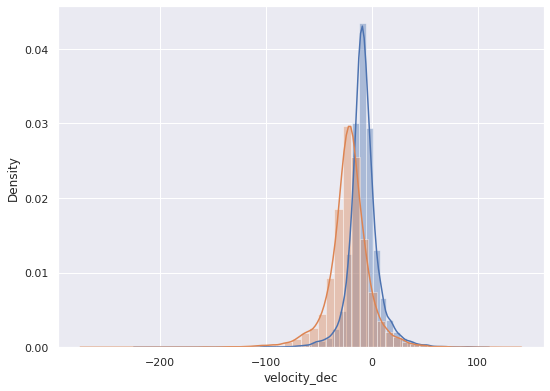

In [ ]:
sns.distplot(all_stars_filtered.velocity_ra)
sns.distplot(all_stars_filtered.velocity_dec)


-15.582486604261831 -39.81685986190475


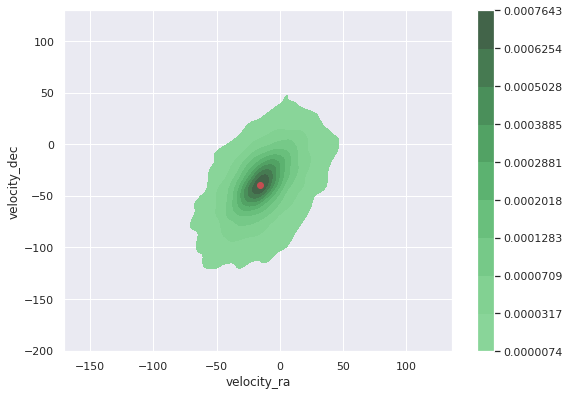

In [ ]:
#cbar_kws = { 'ticks' : np.linspace(0.01, 0.12, 8),
#                'label': 'Probability Density [(mas/year)$^{-2}$]'}


kde = sns.kdeplot(x='velocity_ra', y='velocity_dec', data =all_stars_filtered, shade=True, color = 'g',
                      bw_method = 0.20, cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    center = (x,y)
plt.show()

(array([1408., 1320., 1285., 1293., 1272., 1172., 1135., 1096.,  960.,
         919.]),
 array([1300.11617362, 1380.09640389, 1460.07663417, 1540.05686445,
        1620.03709472, 1700.017325  , 1779.99755528, 1859.97778555,
        1939.95801583, 2019.93824611, 2099.91847638]),
 <a list of 10 Patch objects>)

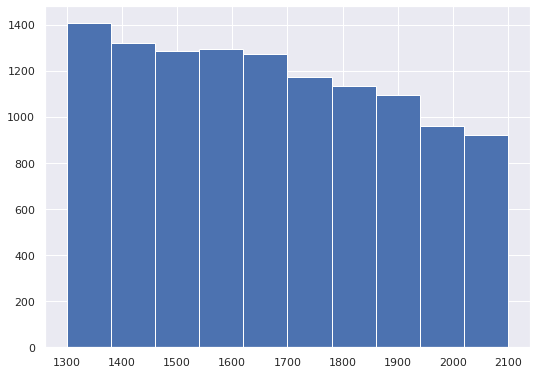

In [ ]:
plt.hist(all_stars.distance_pc)

-2.3977275875465445 -5.124921922924027


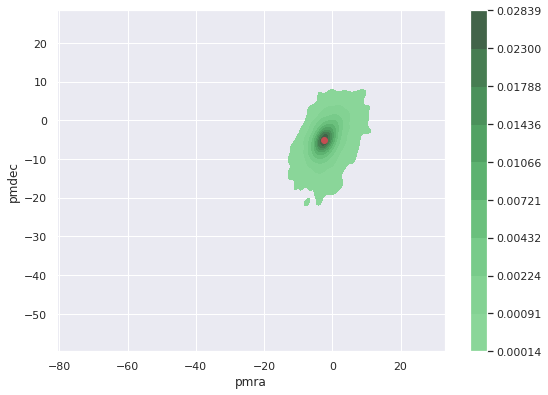

In [ ]:
#cbar_kws = { 'ticks' : np.linspace(0.01, 0.12, 8),
#                'label': 'Probability Density [(mas/year)$^{-2}$]'}


kde = sns.kdeplot(x='pmra', y='pmdec', data =all_stars_filtered, shade=True, color = 'g',
                      bw_method = 0.20, cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    center = (x,y)
plt.show()

1640.5941264061162

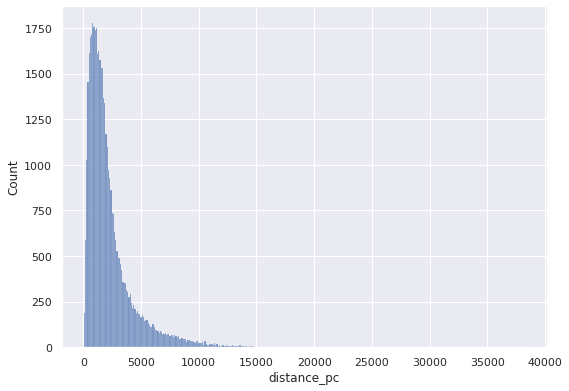

In [ ]:
sns.histplot(all_stars[mask].distance_pc)
np.median(all_stars[mask].distance_pc)

In [ ]:
distance_center = np.median(all_stars[mask].distance_pc)

In [ ]:
distance_literature = 1840

## Building GMM Model

#### Trial 1:

In [ ]:
def visualize_member(working_data):
    plt.figure(figsize=(14,20))

    plt.subplot(321)
    sns.scatterplot(data = working_data, x='pmra', y='pmdec', hue = 'gmm_label')

    plt.subplot(322)
    sns.scatterplot(data = working_data, x='velocity_ra', y='velocity_dec', hue = 'gmm_label')

    plt.subplot(323)
    sns.scatterplot(data = member, x='velocity_ra', y='velocity_dec', label = 'member', color = 'tab:red')

    plt.subplot(324)
    sns.scatterplot(data = non_member, x='velocity_ra', y='velocity_dec', label = 'non_member', color = 'tab:blue')

    plt.subplot(325)
    sns.scatterplot(data = member, x='bp_rp', y='phot_g_mean_mag', color = 'tab:red')
    plt.gca().invert_yaxis()

    plt.subplot(326)
    sns.scatterplot(data = non_member, x='bp_rp', y='phot_g_mean_mag', color = 'tab:blue')
    plt.gca().invert_yaxis()


    plt.show()

In [ ]:
np.linspace(10, 400, 16)

array([ 10.,  36.,  62.,  88., 114., 140., 166., 192., 218., 244., 270.,
       296., 322., 348., 374., 400.])

In [ ]:
widths = np.linspace(50, 800, 16)
widths

array([ 50., 100., 150., 200., 250., 300., 350., 400., 450., 500., 550.,
       600., 650., 700., 750., 800.])

In [ ]:
def get_member(working_data, feature_columns = ['velocity_ra', 'velocity_dec']):
    features = working_data.loc[:,feature_columns].dropna()

    scaled_features = pd.DataFrame({})
    for column in features.columns:
        scaled_features[column] = (features[column] - np.median(features[column]))/np.std(features[column])

    from sklearn.mixture import GaussianMixture
    gmm = GaussianMixture(n_components=2)
    gmm.fit(scaled_features)

    #predictions from gmm
    labels = gmm.predict(scaled_features)

    probs = gmm.predict_proba(scaled_features)

    working_data.loc[:, 'PMemb'] = probs[:, 0]
    working_data.loc[:, 'gmm_label'] = labels

    non_member = working_data[working_data['PMemb'] <= 0.2]
    member = working_data[working_data['PMemb'] >= 0.8]

    if np.std(member.pmra) > np.std(non_member.pmra):
        member = working_data[working_data['PMemb'] <= 0.2]
        non_member = working_data[working_data['PMemb'] >= 0.8]

    return member, non_member

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

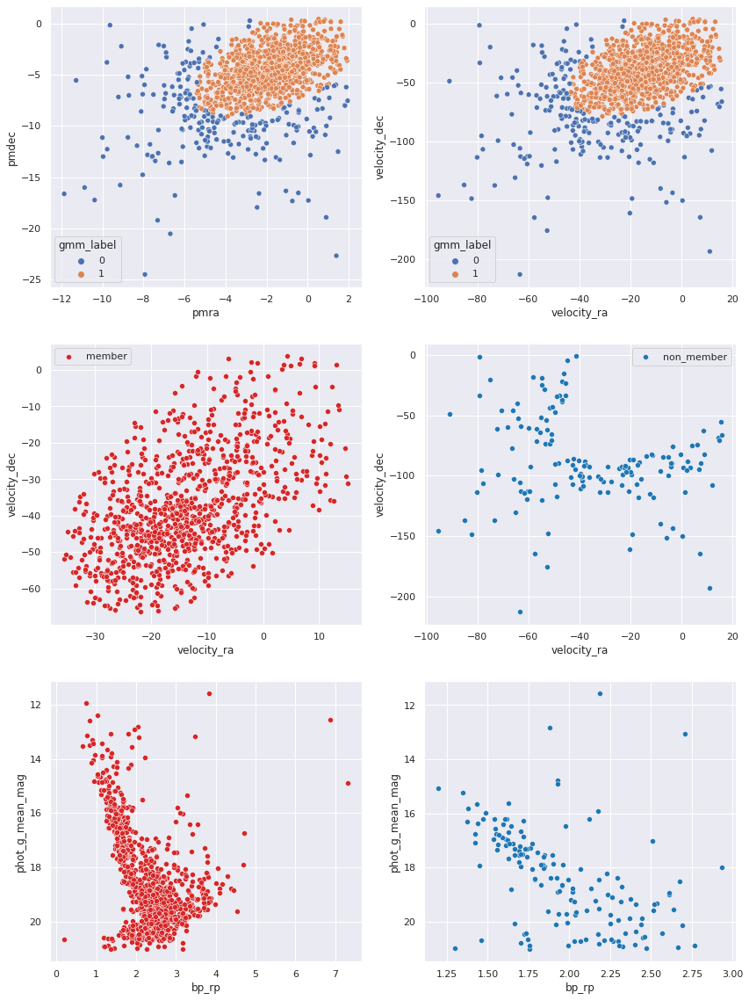

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

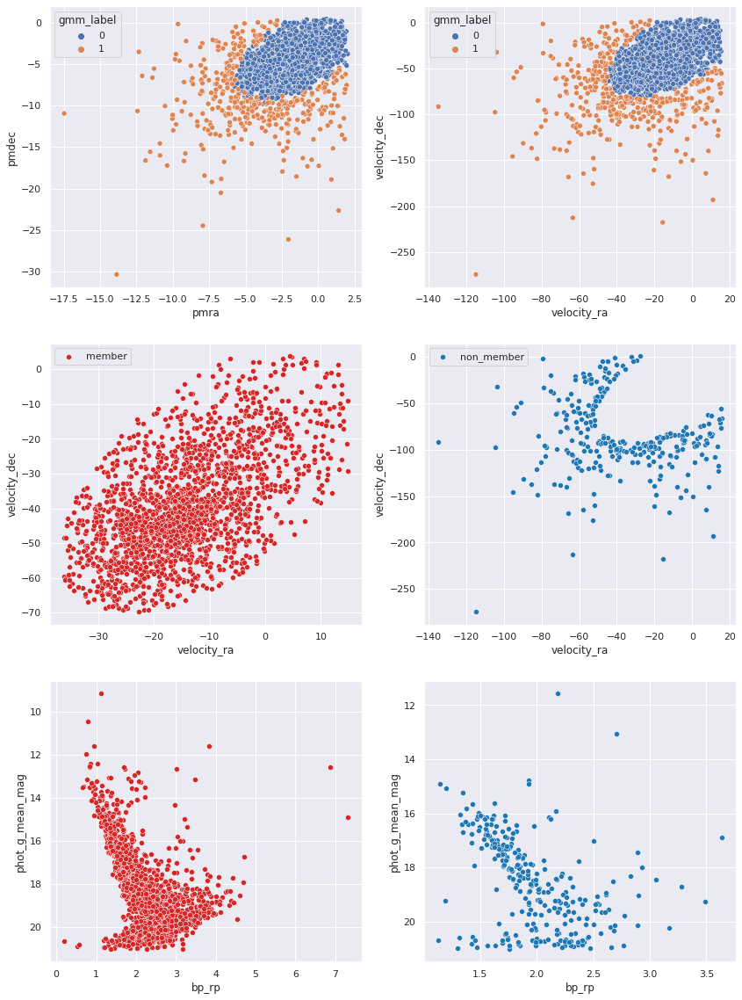

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

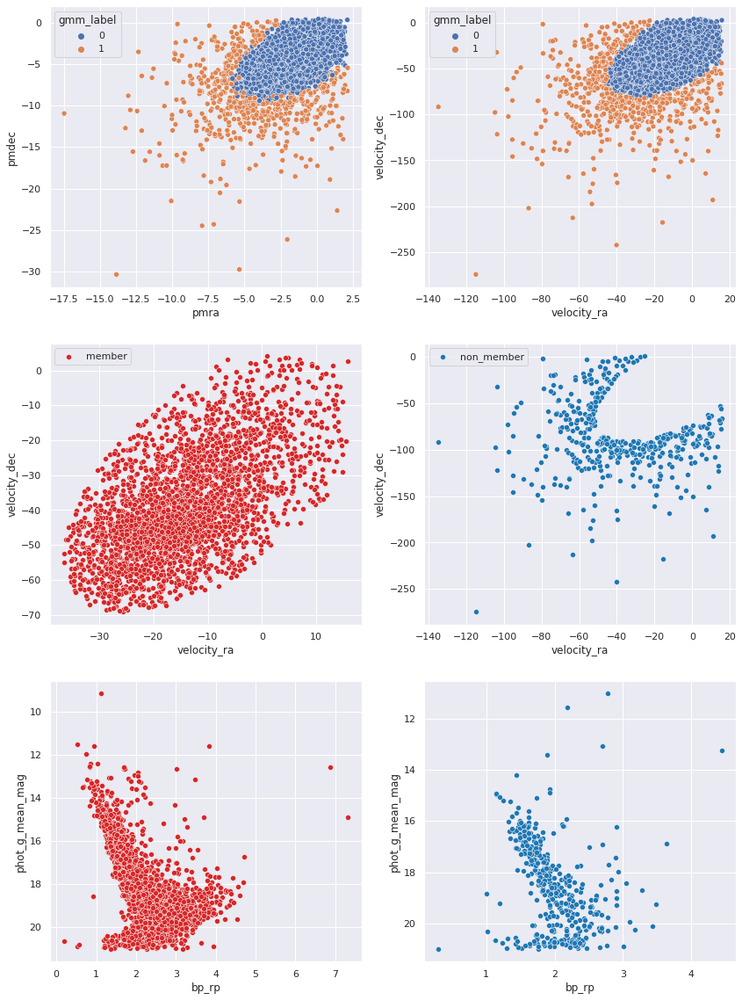

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

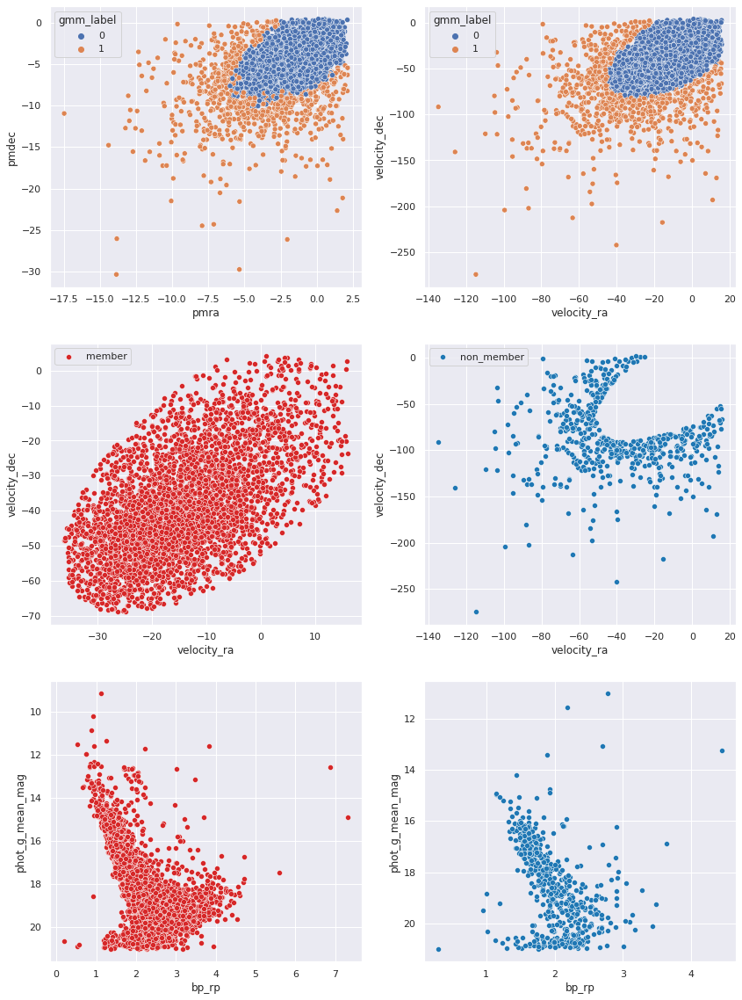

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

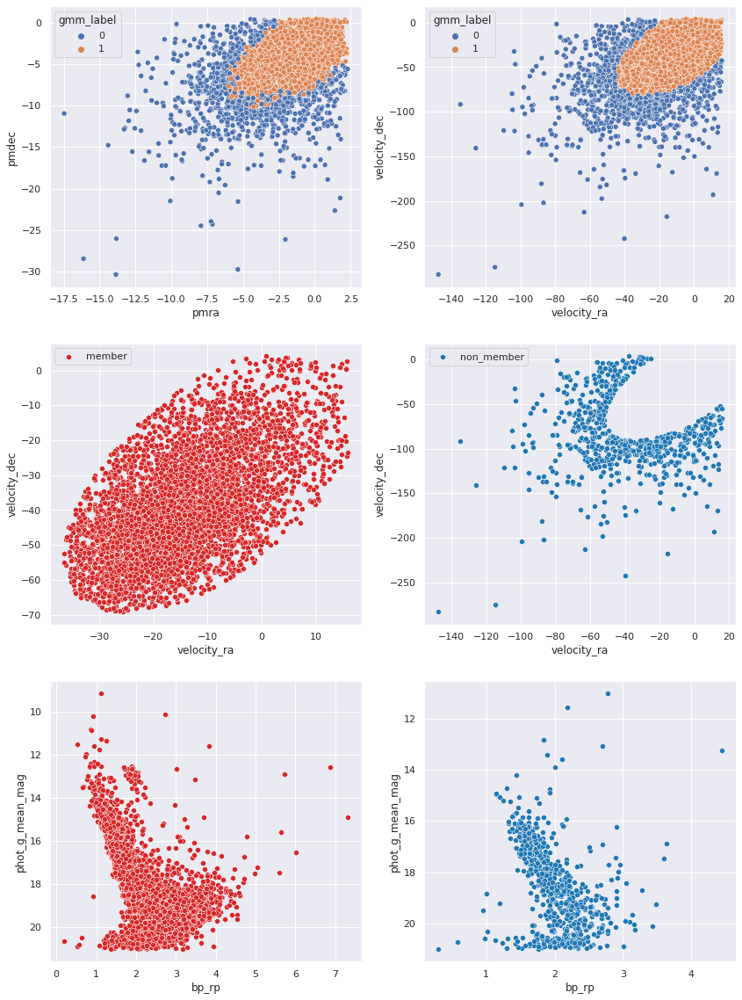

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

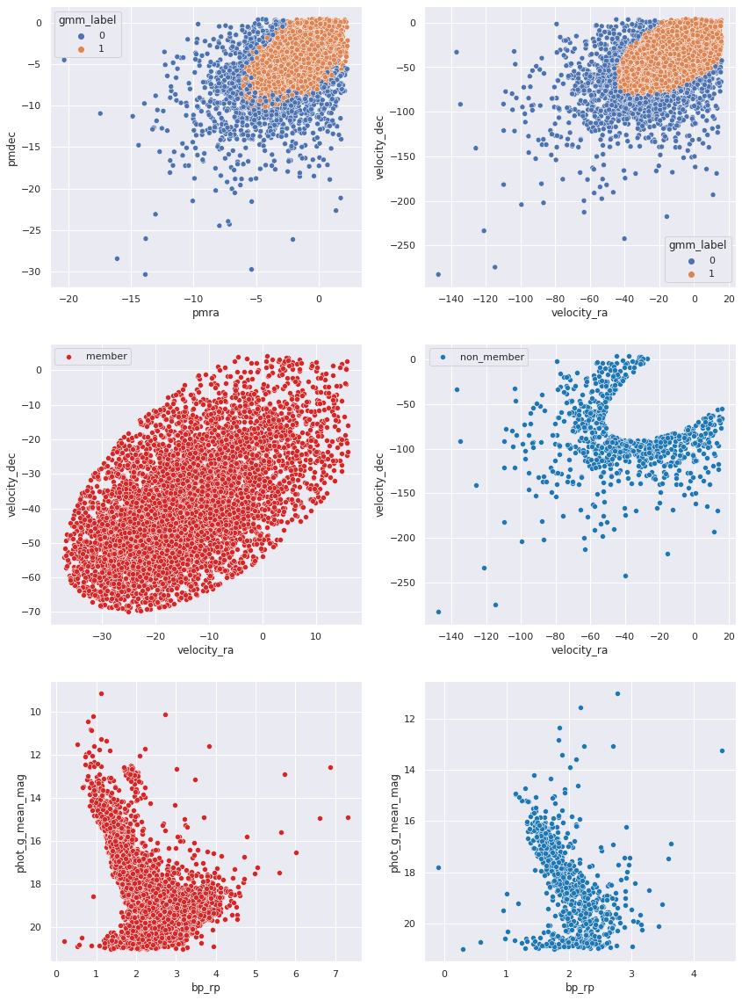

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

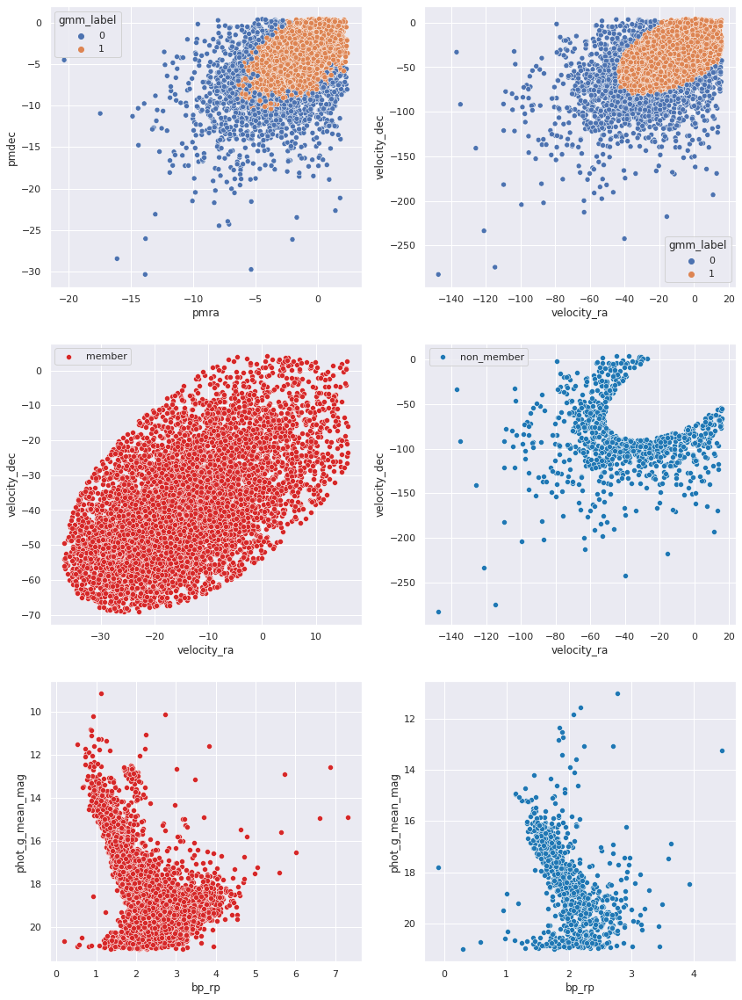

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

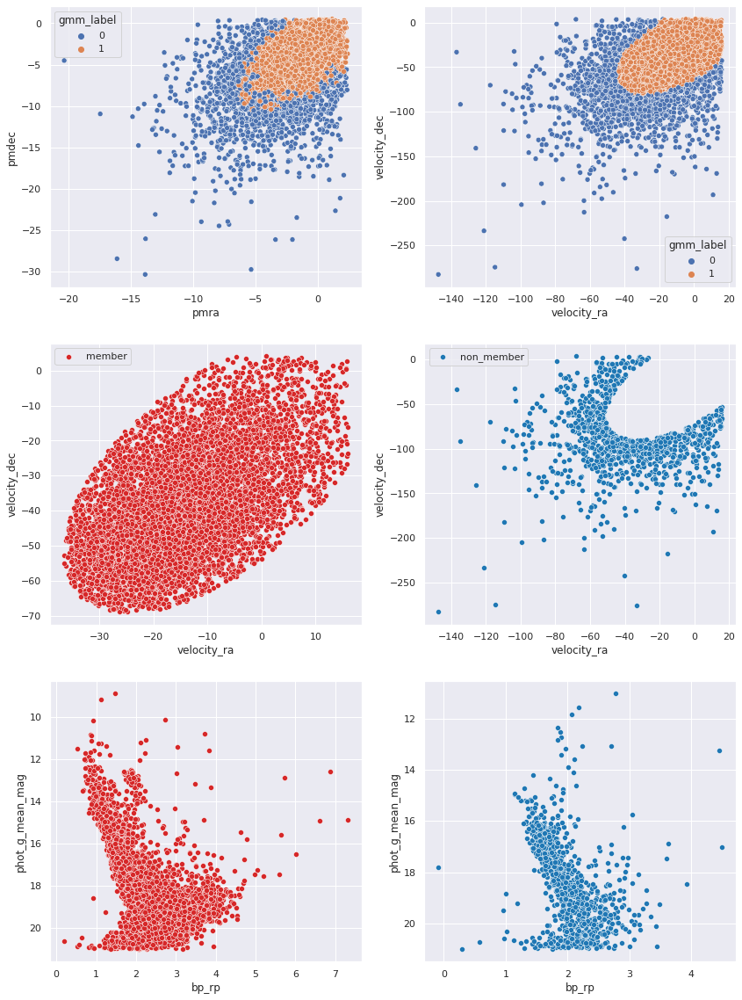

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

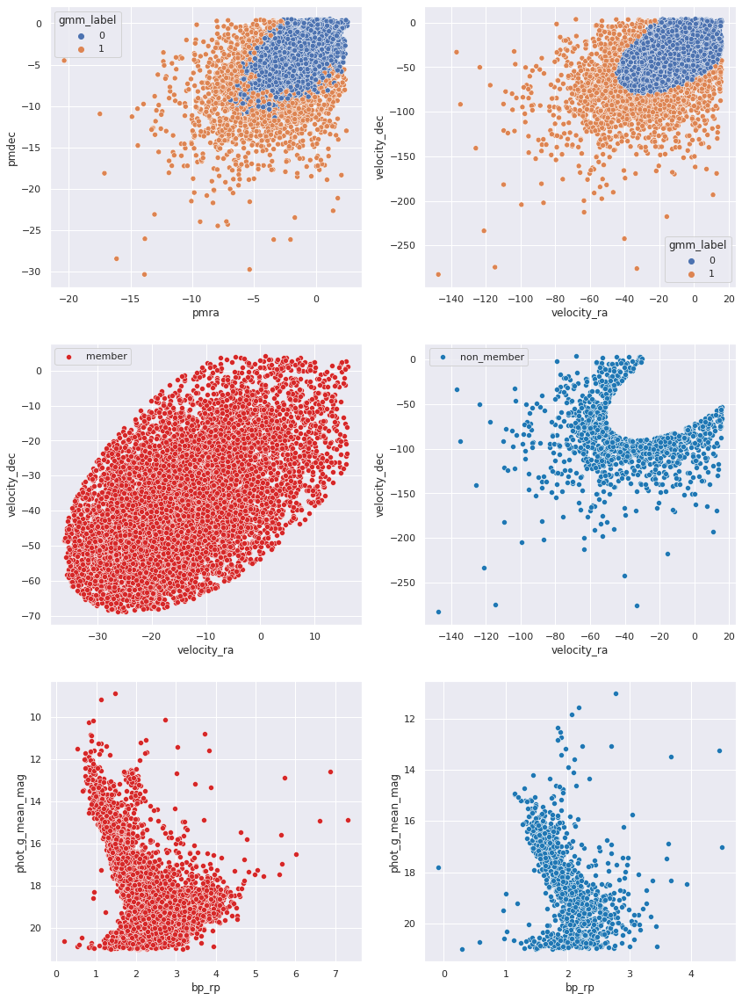

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

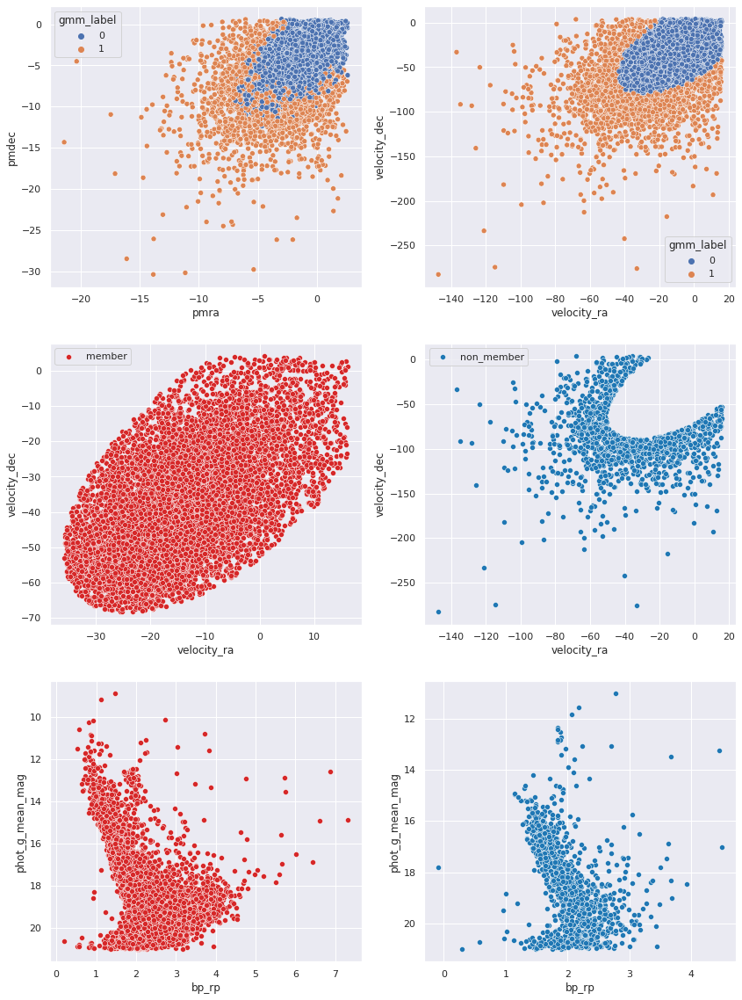

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

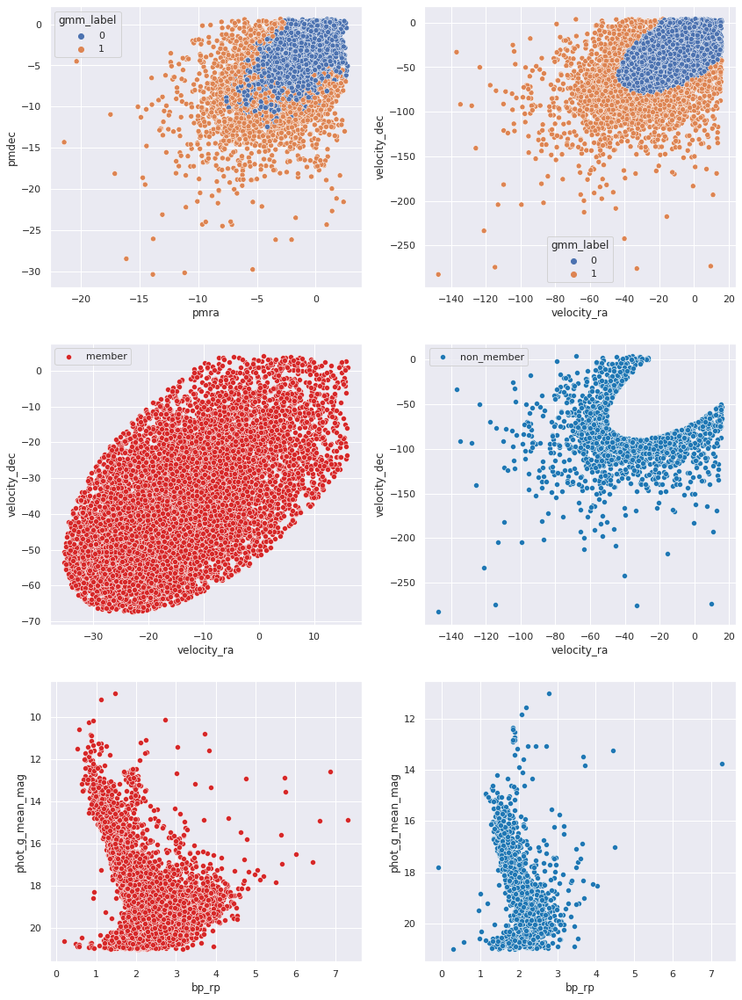

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

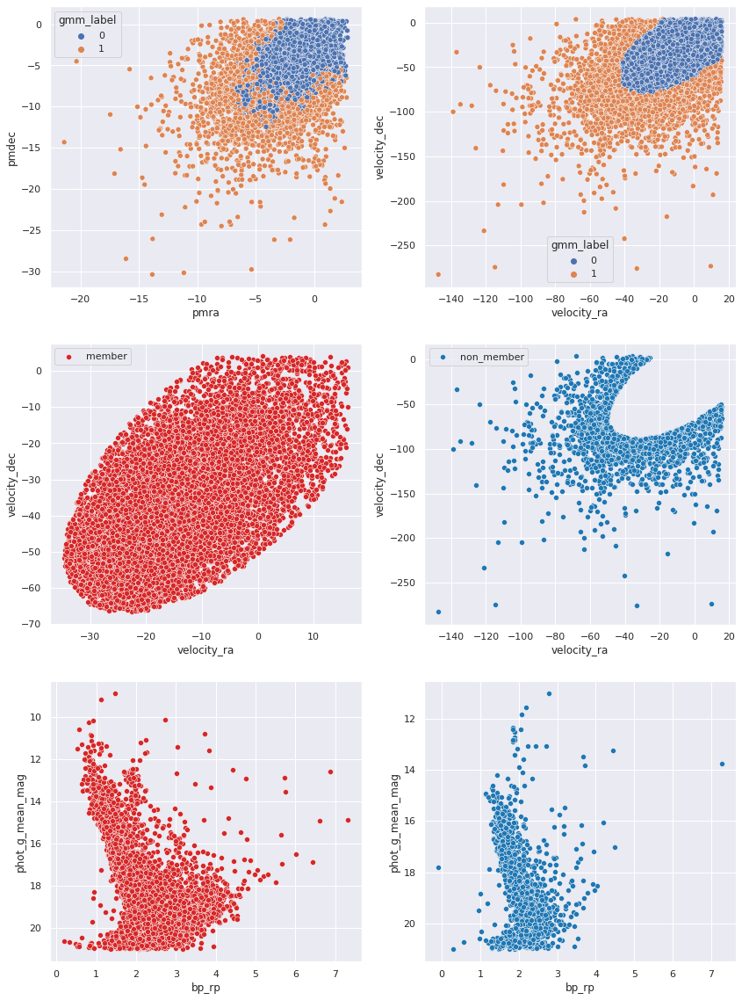

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

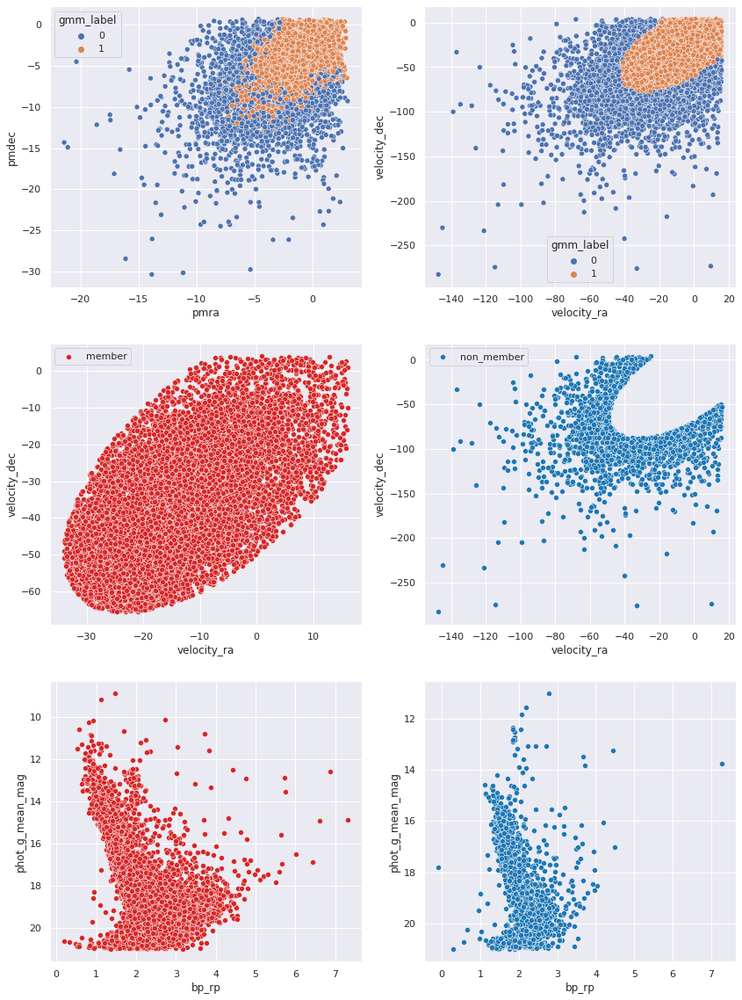

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

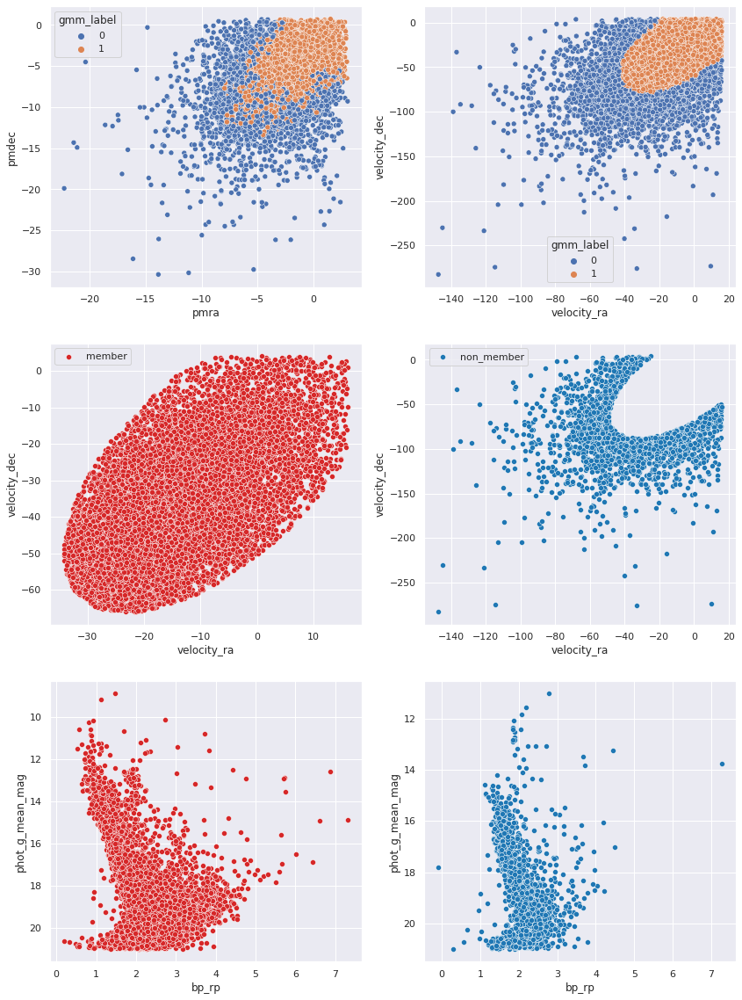

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

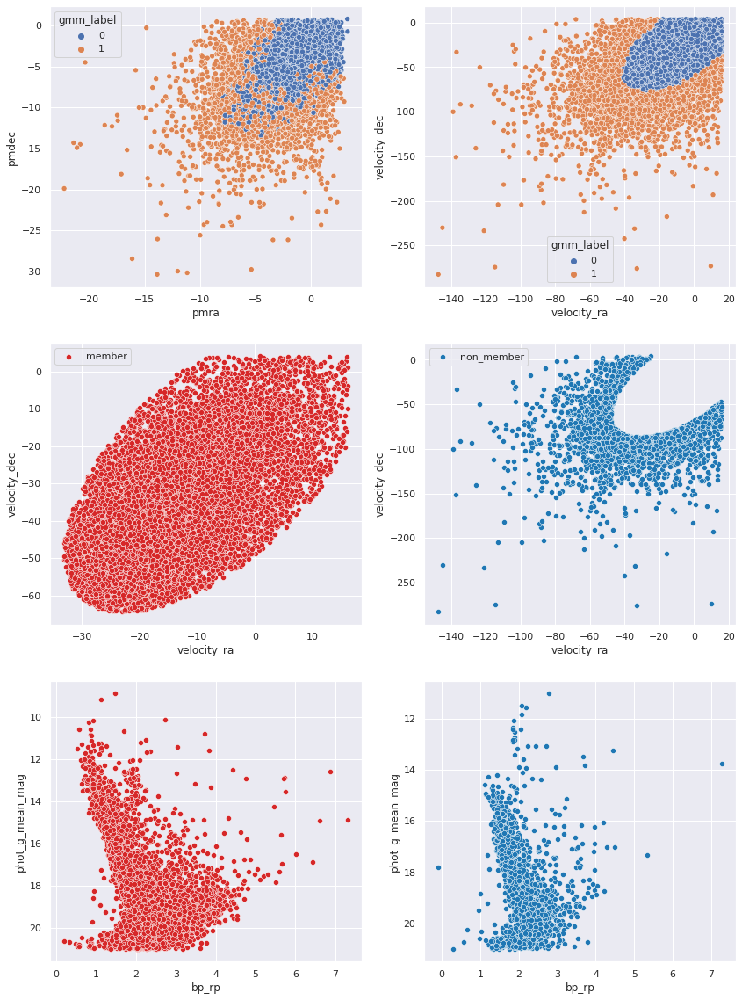

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
/usr/local

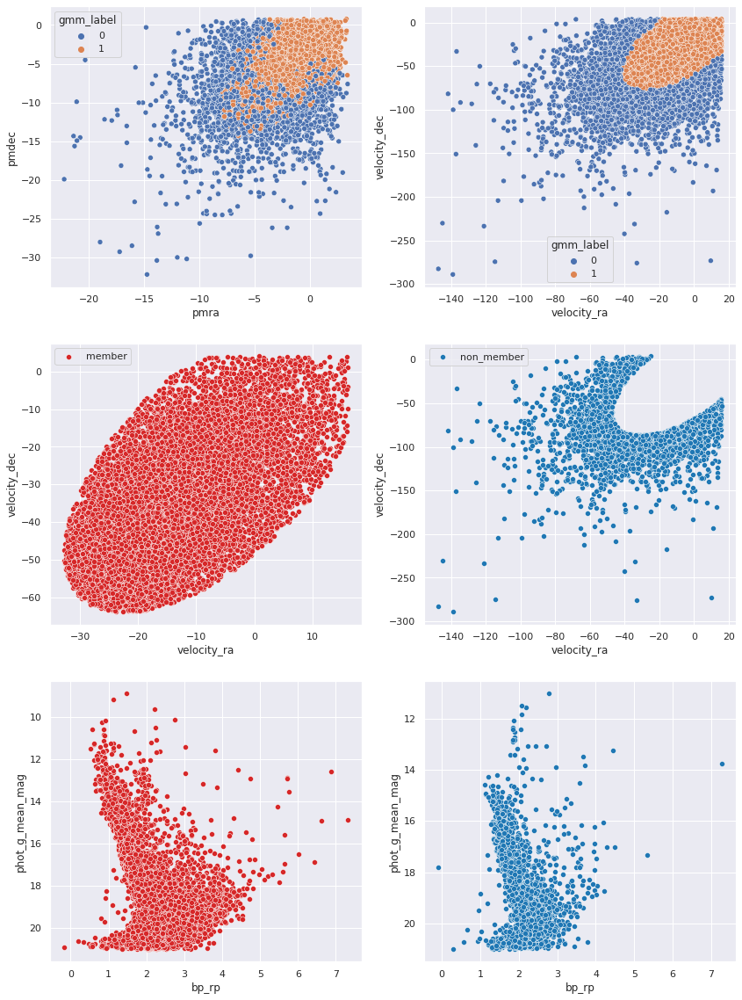

In [ ]:
metrics = np.full(len(widths), -1, dtype='float')
std = np.full((len(widths), 4), -1, dtype='float')
n_trial = 10

for i in range(len(widths)):
    metric_value = 0
    std[i] = [0,0,0,0]

    for _ in range(n_trial):
        width = widths[i]
        filter = abs(all_stars.distance_pc - distance_literature) < width
        working_data = all_stars[mask][filter]

        feature_columns = ['velocity_ra', 'velocity_dec']
        
        member, non_member = get_member(working_data, feature_columns)

        if np.std(member.velocity_ra) != 0:
            metric_1 = (np.std(non_member.velocity_ra) - np.std(member.velocity_ra)) / np.std(member.velocity_ra)
        if np.std(member.velocity_dec) != 0:
            metric_2 = (np.std(non_member.velocity_dec) - np.std(member.velocity_dec)) / np.std(member.velocity_dec)

        metric_value += np.mean([metric_1, metric_2])
        std[i] += [np.std(member.velocity_ra), np.std(member.velocity_dec), np.std(non_member.velocity_ra), np.std(non_member.velocity_dec)]
    
    metrics[i] = metric_value/n_trial
    std[i] /= n_trial

    visualize_member(working_data)

#true_positive = sum(member.label == 1)/(len(member)+1)
#true_negative = sum(non_member.label == 0)/(len(non_member)+1)
#accuracy_value = np.mean([true_positive, true_negative])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


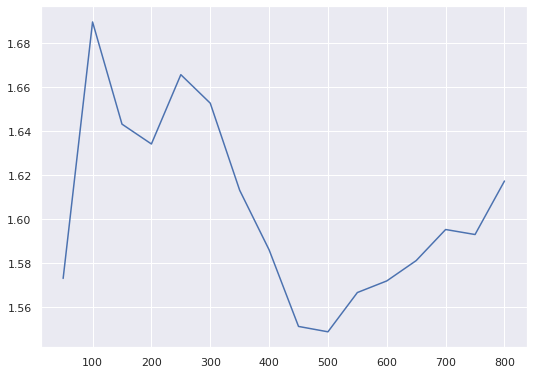

In [ ]:
sns.lineplot(widths, metrics)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

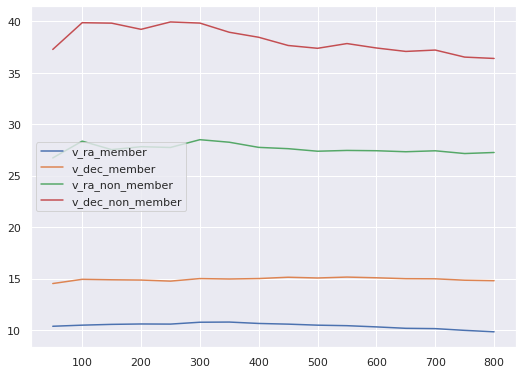

In [ ]:
std_index = ["v_ra_member", 'v_dec_member', 'v_ra_non_member', 'v_dec_non_member']
for i in range(len(std_index)):
    sns.lineplot(widths, std[:, i], label = std_index[i])

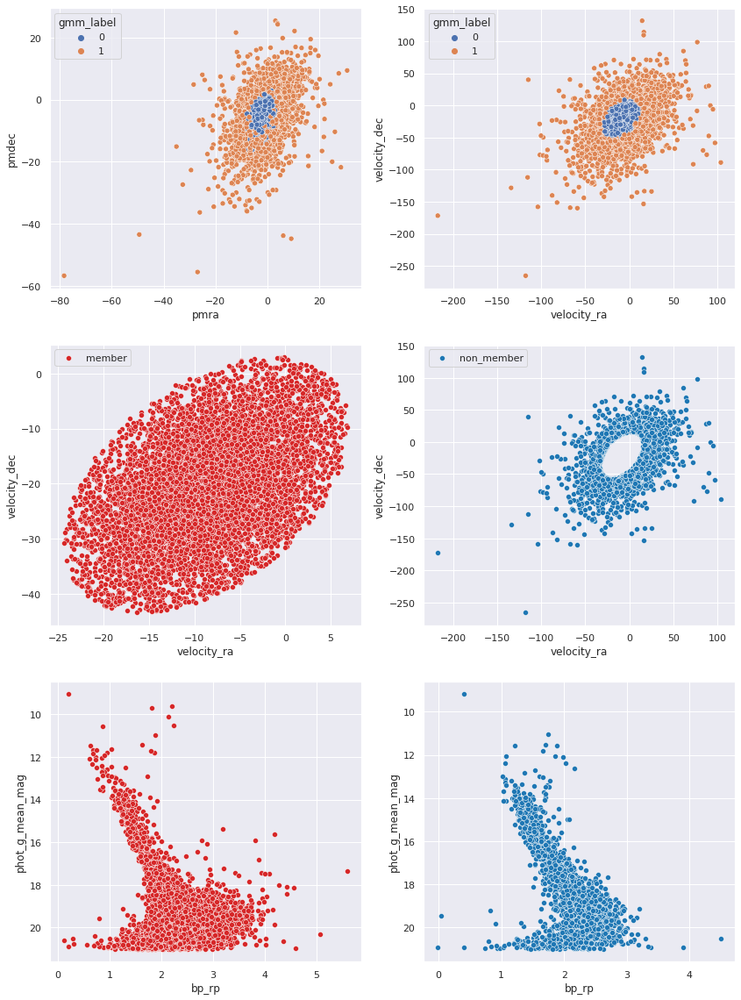

In [ ]:
metrics = np.full(len(widths), -1, dtype='float')
std = np.full((len(widths), 4), -1, dtype='float')
n_trial = 10

for i in range(1):
    metric_value = 0
    std[i] = [0,0,0,0]

    for _ in range(n_trial):
        width = widths[i]
        #filter = (abs(all_stars['velocity_ra'] - v_ra_center) < width) & (abs(all_stars['velocity_dec'] - v_dec_center) < width)
        working_data = all_stars_filtered

        feature_columns = ['velocity_ra', 'velocity_dec']
        
        member, non_member = get_member(working_data, feature_columns)

        if np.std(member.velocity_ra) != 0:
            metric_1 = (np.std(non_member.velocity_ra) - np.std(member.velocity_ra)) / np.std(member.velocity_ra)
        if np.std(member.velocity_dec) != 0:
            metric_2 = (np.std(non_member.velocity_dec) - np.std(member.velocity_dec)) / np.std(member.velocity_dec)

        metric_value += np.mean([metric_1, metric_2])
        std[i] += [np.std(member.velocity_ra), np.std(member.velocity_dec), np.std(non_member.velocity_ra), np.std(non_member.velocity_dec)]
    
    metrics[i] = metric_value/n_trial
    std[i] /= n_trial

    visualize_member(working_data)

#true_positive = sum(member.label == 1)/(len(member)+1)
#true_negative = sum(non_member.label == 0)/(len(non_member)+1)
#accuracy_value = np.mean([true_positive, true_negative])

In [ ]:
metrics

array([ 3.75191159, -1.        , -1.        , -1.        , -1.        ,
       -1.        , -1.        , -1.        , -1.        , -1.        ,
       -1.        , -1.        , -1.        , -1.        , -1.        ,
       -1.        ])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


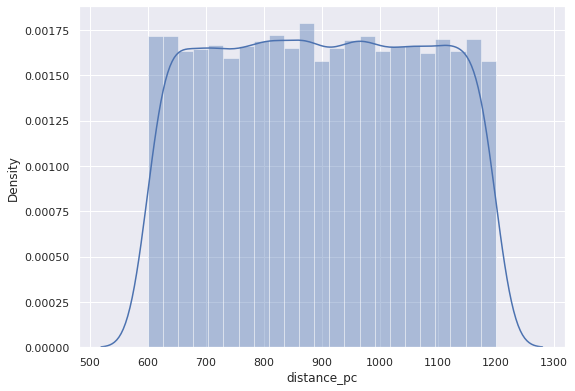

In [ ]:
sns.distplot(all_stars_filtered.distance_pc)

In [ ]:
feature_columns = ['velocity_ra', 'velocity_dec']

features = all_stars.loc[:,feature_columns].dropna()

scaled_features = pd.DataFrame({})
for column in features.columns:
    scaled_features[column] = (features[column] - np.median(features[column]))/np.std(features[column])

from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2)
gmm.fit(scaled_features)

working_data = all_stars

#predictions from gmm
labels = gmm.predict(scaled_features)

probs = gmm.predict_proba(scaled_features)

working_data.loc[:, 'PMemb'] = probs[:, 0]
working_data.loc[:, 'gmm_label'] = labels

non_member = working_data[working_data['PMemb'] <= 0.2]
member = working_data[working_data['PMemb'] >= 0.8]

if np.std(member.pmra) > np.std(non_member.pmra):
    member = working_data[working_data['PMemb'] <= 0.2]
    non_member = working_data[working_data['PMemb'] >= 0.8]

metric_1 = (np.std(non_member.velocity_ra) - np.std(member.velocity_ra)) / np.std(member.velocity_ra)
metric_2 = (np.std(non_member.velocity_dec) - np.std(member.velocity_dec)) / np.std(member.velocity_dec)

metric_value = np.mean([metric_1, metric_2])

#true_positive = sum(member.label == 1)/(len(member)+1)
#true_negative = sum(non_member.label == 0)/(len(non_member)+1)
#accuracy_value = np.mean([true_positive, true_negative])

In [ ]:
metric_value

3.352245825628003

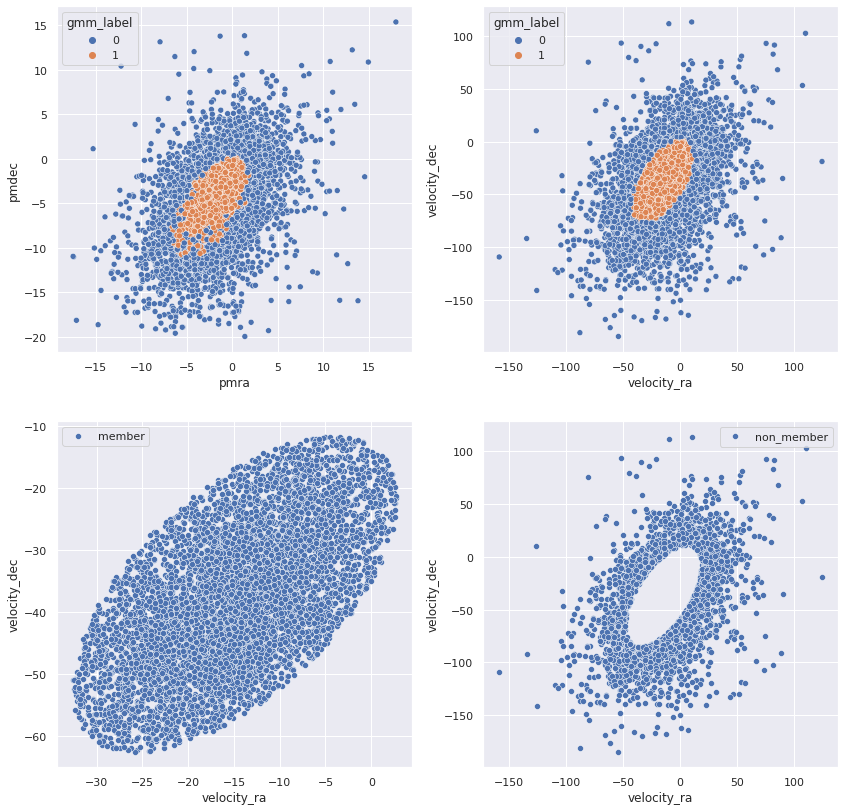

In [ ]:
plt.figure(figsize=(14,14))

plt.subplot(221)
sns.scatterplot(data = working_data, x='pmra', y='pmdec', hue = 'gmm_label')

plt.subplot(222)
sns.scatterplot(data = working_data, x='velocity_ra', y='velocity_dec', hue = 'gmm_label')

plt.subplot(223)
sns.scatterplot(data = member, x='velocity_ra', y='velocity_dec', label = 'member')

plt.subplot(224)
sns.scatterplot(data = non_member, x='velocity_ra', y='velocity_dec', label = 'non_member')


plt.show()

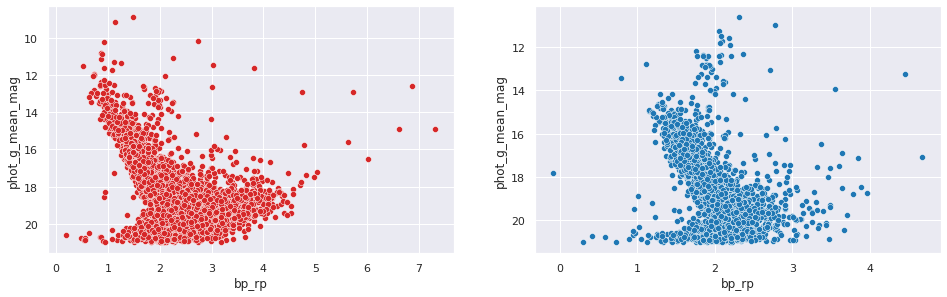

In [ ]:
plt.figure(figsize=(16, 10))

plt.subplot(221)
sns.scatterplot(data = member, x='bp_rp', y='phot_g_mean_mag', color = 'tab:red')
plt.gca().invert_yaxis()

plt.subplot(222)
sns.scatterplot(data = non_member, x='bp_rp', y='phot_g_mean_mag', color = 'tab:blue')
plt.gca().invert_yaxis()


(878.6331913801213, 81.96362878005772)

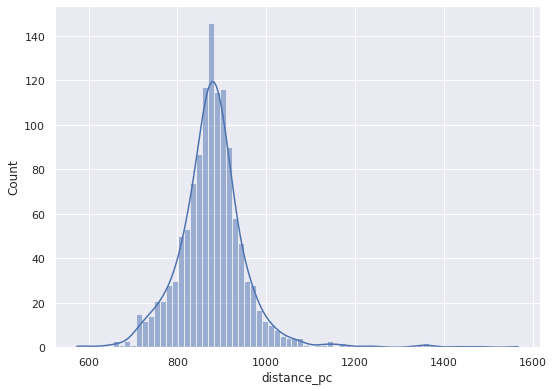

In [ ]:
sns.histplot(member.distance_pc, kde = True)
np.mean(member.distance_pc), np.std(member.distance_pc)

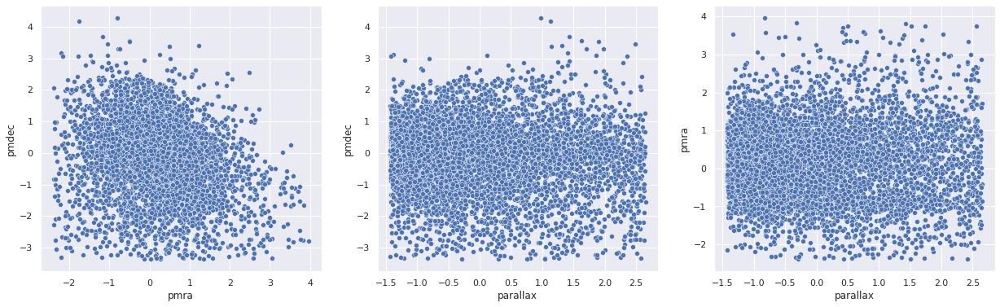

In [ ]:

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21,6))
#fig.figure(figsize = (35,6))
#fig.suptitle('Horizontally stacked subplots')
#ax1.plot(x, y)
#ax2.plot(x, -y)

sns.scatterplot(x='pmra', y='pmdec', data=scaled_features, ax=ax1)
#plt.show()

#plt.subplot(132)
sns.scatterplot(x='parallax', y='pmdec', data=scaled_features, ax=ax2)
#plt.show()

#plt.subplot(133)
sns.scatterplot(x='parallax', y='pmra', data=scaled_features, ax=ax3)
plt.show()

In [ ]:

#scaler = MinMaxScaler()
#scaler.fit(features)

In [ ]:
#scaler.transform(features)

In [ ]:
#scaled_feature = scaler.transform(features)

In [ ]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2)
gmm.fit(scaled_features)



GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=2, n_init=1, precisions_init=None,
                random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)

In [ ]:
len(all_stars), len(scaled_features)

(14115, 14115)

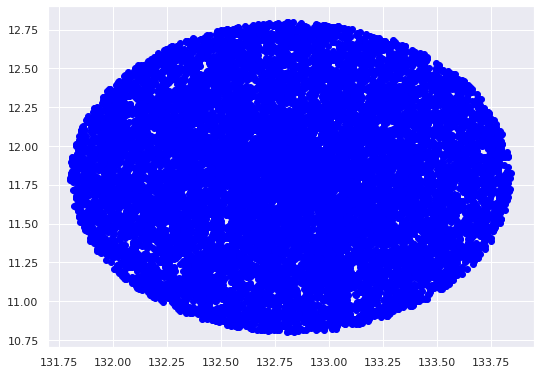

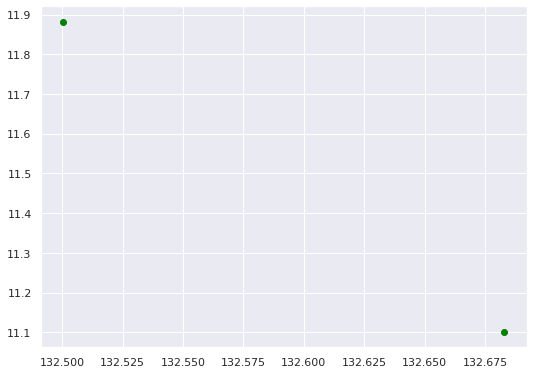

In [ ]:
#predictions from gmm
labels = gmm.predict(scaled_features)

probs = gmm.predict_proba(scaled_features)

all_stars['PMemb'] = probs[:, 1]
all_stars['cluster'] = labels

color=['blue','green']
for k in range(0,2):
    data = all_stars[all_stars["cluster"]==k]
    plt.scatter(data["ra"],data["dec"],c=color[k])
    plt.show()

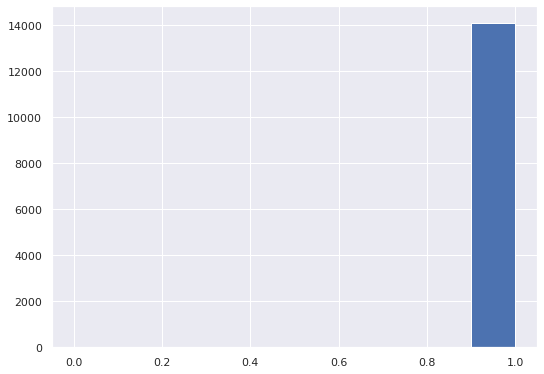

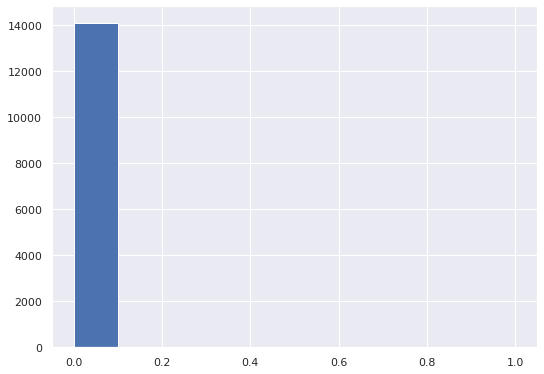

In [ ]:
plt.hist(probs[:, 0])
#plt.ylim(0, 3500)
plt.show()
plt.hist(probs[:, 1])
plt.show()

In [ ]:
probs.shape

(3841, 2)

In [ ]:
non_member = all_stars[all_stars['PMemb'] <= 0.2]
member = all_stars[all_stars['PMemb'] >= 0.8]

if np.std(member.parallax) > np.std(non_member.parallax):
    member = all_stars[all_stars['PMemb'] <= 0.2]
    non_member = all_stars[all_stars['PMemb'] >= 0.8]

In [ ]:
len(member), len(non_member)

(2, 14113)

In [ ]:
metric_1 = (np.std(non_member.parallax) - np.std(member.parallax)) / np.std(member.parallax)
metric_2 = (np.std(non_member.pmra) - np.std(member.pmra)) / np.std(member.pmra)
metric_3 = (np.std(non_member.pmdec) - np.std(member.pmdec)) / np.std(member.pmdec)

metric_1, metric_2, metric_3, metric_1+metric_2+metric_3

(1230.8061934262937,
 0.5978821249607227,
 1.0212202748992278,
 1232.4252958261536)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


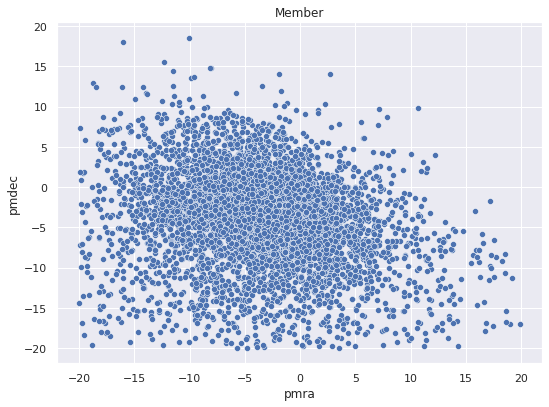

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


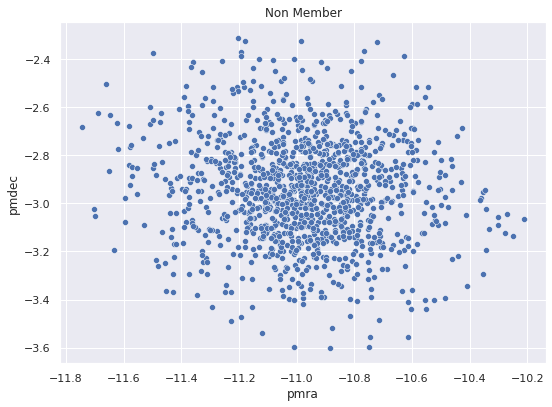

In [ ]:
#member = features[features['cluster'] == 1]
#non_member = features[features['cluster'] == 0]
sns.scatterplot('pmra', 'pmdec', data = member)
plt.title('Member')
plt.show()

sns.scatterplot('pmra', 'pmdec', data = non_member)
plt.title('Non Member')
plt.show()

In [ ]:
all_stars.cluster.value_counts()

1    2201
0    1640
Name: cluster, dtype: int64

In [ ]:
len(member), len(non_member)

(4279, 2612)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


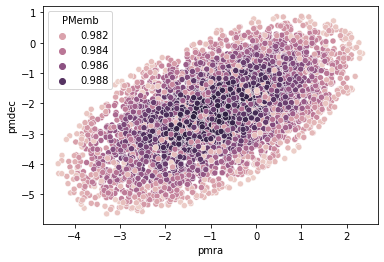

In [ ]:
sns.scatterplot('pmra', 'pmdec', hue = 'PMemb', data = all_stars[all_stars.PMemb > 0.98 ])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


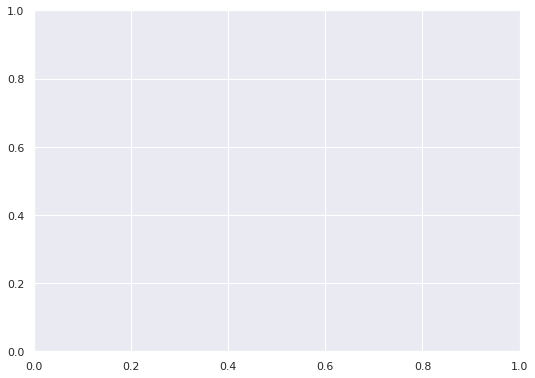

In [ ]:
sns.scatterplot('parallax', 'PMemb', data = all_stars[all_stars.PMemb > 0.98])
plt.show()

#### Visualizing Training Data


In [ ]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,velocity_ra,velocity_dec,PMemb,cluster,distance_pc,gmm_label,member
count,7.070000e+03,7.070000e+03,7.070000e+03,7070.0,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.0,7070.000000,7064.000000,7064.000000,7070.000000,7070.000000,7070.000000,...,7070.000000,7070.000000,7070.000000,7070.000000,178.000000,178.000000,7070.000000,178.000000,178.000000,178.000000,7070.000000,7070.000000,7070.000000,7070.000000,2540.000000,2540.000000,2540.000000,2540.000000,2046.000000,2046.000000,2046.000000,2046.000000,2046.000000,2046.000000,2455.0,2455.000000,2455.000000,2455.000000,2455.000000,2455.000000,2455.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.000000,7070.0,7070.000000,7070.000000,7070.000000
mean,1.635721e+18,6.034444e+17,8.520851e+08,2015.5,132.815451,0.304638,11.802584,0.199227,1.129375,0.382983,10.730733,-4.748448,0.639710,-3.583690,0.429258,-0.315001,-0.227283,-0.274364,0.159887,0.237396,0.290294,-0.684343,0.427930,-0.151251,-0.401770,321.429703,12.845545,319.137199,2.292504,1.569966,426.486816,0.276913,3.108839,31.0,20.095650,1.462191,0.052631,0.040779,36.847808,12.229986,...,0.030127,1.549572,0.671531,0.878042,28.556171,1.671342,0.312871,5379.213379,3.443820,-0.078652,215.688200,31.887826,131.950199,-5.620983,100016.062992,5331.826660,5154.535156,5587.626953,0.327915,0.185112,0.515265,0.161937,0.090961,0.254398,200111.0,1.421281,1.312463,1.514573,3.597988,3.344912,3.851060,0.595437,0.002596,-20654.580486,-16101.760064,0.829434,0.0,965.727984,0.176096,0.176096
std,0.000000e+00,3.072037e+15,4.843697e+08,0.0,0.467852,0.342844,0.469264,0.226479,0.337927,0.424323,12.329839,6.290309,0.714514,5.108781,0.496877,0.129202,0.155437,0.147010,0.154303,0.189235,0.141953,0.086162,0.185294,0.221450,0.126463,47.250060,61.535172,46.923786,2.483247,7.390333,2008.481323,0.593322,58.552425,0.0,56.131920,0.132858,0.055699,0.031077,5.227275,0.862448,...,0.170950,0.558369,0.325928,0.284721,23.742060,2.224792,2.041164,687.471008,0.694767,0.266001,0.553449,0.457290,0.462869,0.466636,172.583638,650.191101,627.926697,722.723145,0.314492,0.244163,0.380543,0.156059,0.120287,0.189068,0.0,2.487692,2.344022,2.628923,23.159924,21.693438,24.629303,0.274655,0.002623,27382.153142,23694.503930,0.364647,0.0,282.675873,0.380929,0.380929
min,1.635721e+18,5.986135e+17,2.657300e+04,2015.5,131.804555,0.017678,10.804023,0.011441,0.625008,0.021383,0.267490,-19.999044,0.037077,-19.966204,0.024244,-0.944230,-0.896278,-0.847718,-0.713499,-0.510428,-0.711816,-0.954622,-0.375766,-0.709859,-0.963790,110.000000,0.000000,11

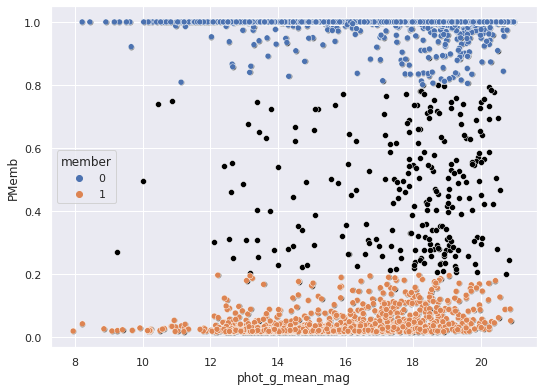

In [ ]:
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = all_stars, color = 'black')
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', hue = 'member', data = training_data)

(array([5829.,   25.,   22.,   19.,   18.,   20.,   12.,   28.,   43.,
        1295.]),
 array([0.        , 0.09984119, 0.19968239, 0.29952358, 0.39936478,
        0.49920597, 0.59904717, 0.69888836, 0.79872956, 0.89857075,
        0.99841195]),
 <a list of 10 Patch objects>)

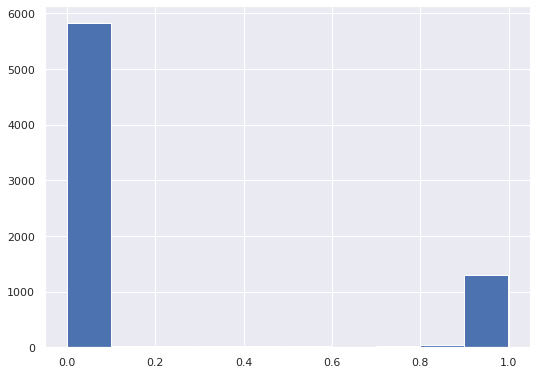

In [ ]:
plt.hist(all_stars.PMemb)

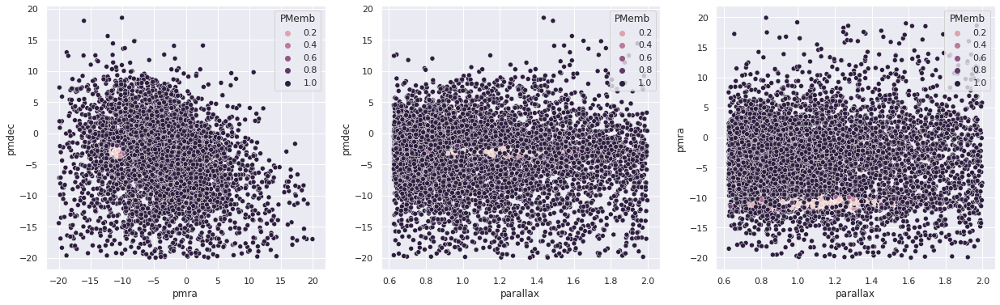

In [ ]:

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21,6))
#fig.figure(figsize = (35,6))
#fig.suptitle('Horizontally stacked subplots')
#ax1.plot(x, y)
#ax2.plot(x, -y)

sns.scatterplot(x='pmra', y='pmdec', data = all_stars, hue = 'PMemb', ax=ax1)
#plt.show()

#plt.subplot(132)
sns.scatterplot(x='parallax', y='pmdec', data = all_stars, hue = 'PMemb', ax=ax2)
#plt.show()

#plt.subplot(133)
sns.scatterplot(x='parallax', y='pmra', data = all_stars, hue = 'PMemb', ax=ax3)
plt.show()

#sns.scatterplot(x='pmra', y ='pmdec', data = all_stars, hue = 'PMemb')

-10.950495139793384 -2.9619947716953106


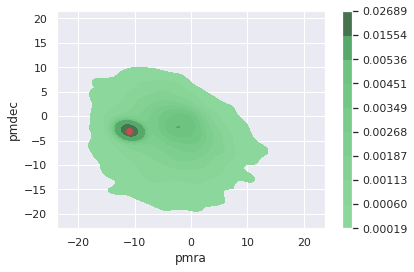

In [ ]:
%matplotlib inline
# neural network --> three side


#cbar_kws = { 'ticks' : np.linspace(0.01, 0.12, 8),
#               'label': 'Probability Density [(mas/year)$^{-2}$]'}

kde = sns.kdeplot(x='pmra', y='pmdec', data =all_stars, shade=True, color = 'g',
                      bw_method = 0.20, cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    center = (x,y)
plt.show()

1.1313717190787578 -2.9647642391944053


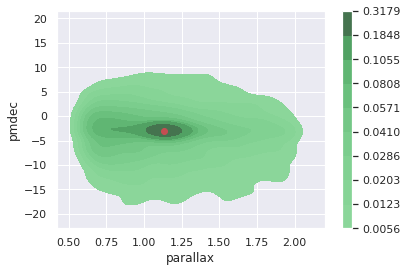

In [ ]:
kde = sns.kdeplot(x='parallax', y='pmdec', data =all_stars, shade=True, color = 'g',
                      bw_method = 0.20, cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    center = (x,y)
plt.show()

1.141714750952221 -10.987522588885282


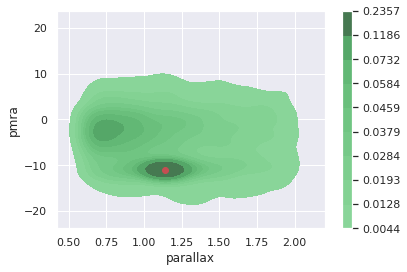

In [ ]:
kde = sns.kdeplot(x='parallax', y='pmra', data =all_stars, shade=True, color = 'g',
                      bw_method = 0.20, cbar=True)

for path in kde.collections[-1].get_paths():
    x, y = path.vertices.mean(axis=0)
    kde.plot(x, y, "ro")
    print(x, y)
    center = (x,y)
plt.show()

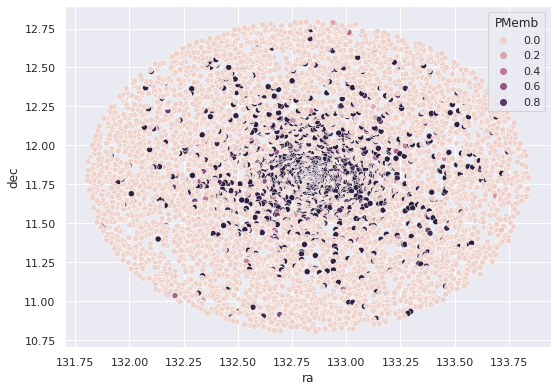

In [ ]:
sns.scatterplot(x='ra', y ='dec', data = all_stars, hue = 'PMemb')

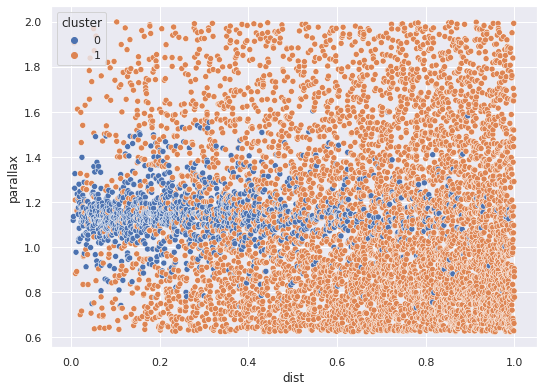

In [ ]:
sns.scatterplot(x='dist', y ='parallax', data = all_stars, hue = 'cluster')

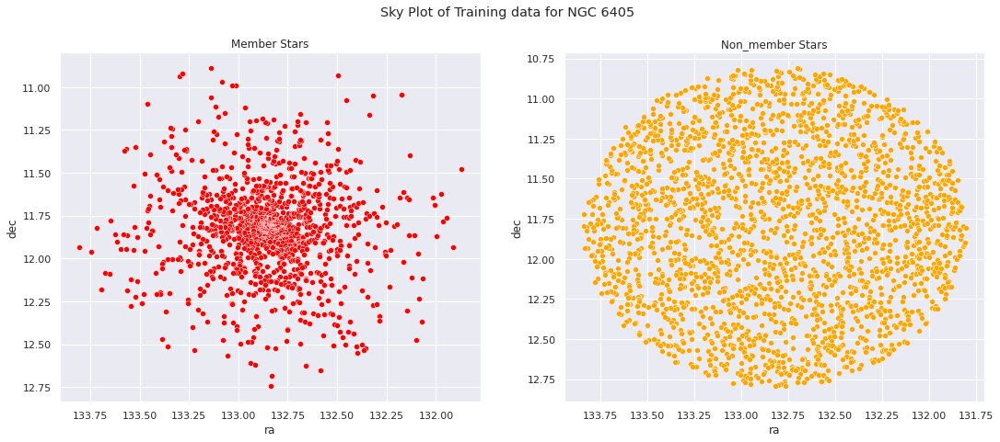

In [ ]:


fig, axes = plt.subplots(1, 2, figsize=(18,7))
fig.suptitle('Sky Plot of Training data for NGC 6405')

skyplot = sns.scatterplot(x = 'ra', y='dec', palette='YlOrRd', color = 'red', data = member,
                         ax = axes[0])
skyplot.invert_xaxis()
axes[0].set_title('Member Stars')
axes[0].invert_yaxis()

#plt.show()
skyplot = sns.scatterplot(x = 'ra', y='dec', palette='YlOrRd', color = 'orange', data = non_member,
                         ax = axes[1])
skyplot.invert_xaxis()
axes[1].set_title('Non_member Stars')
axes[1].invert_yaxis()

plt.show()

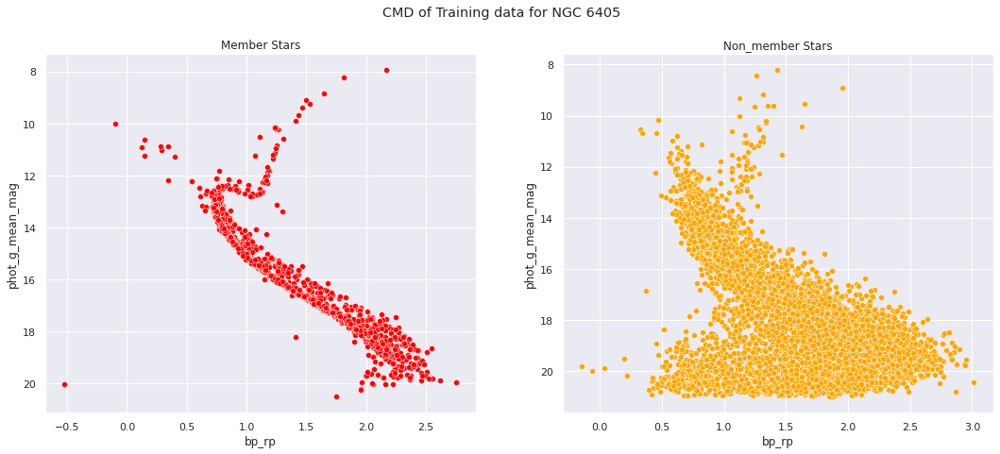

In [ ]:
# CMD marked with the membership probabilities of the stars 
# (PMemb >= 0.5 stars are the probable stars)
#cmd = sns.scatterplot(x = 'bp_rp', y='phot_g_mean_mag', palette='YlOrRd', hue = 'PMemb', data = training_data)
#cmd.invert_yaxis()
#plt.title('')
#plt.show()

# proper motion plot marked with the membership probabilities of the stars 

fig, axes = plt.subplots(1, 2, figsize=(18,7))
fig.suptitle('CMD of Training data for NGC 6405 ')

sns.scatterplot(x = 'bp_rp', y='phot_g_mean_mag', palette='YlOrRd', color = 'red',
                data = member, ax = axes[0])
axes[0].set_title('Member Stars')
axes[0].invert_yaxis()

#plt.show()
sns.scatterplot(x = 'bp_rp', y='phot_g_mean_mag', palette='YlOrRd', color = 'orange',
                data = non_member, ax = axes[1])
axes[1].set_title('Non_member Stars')
axes[1].invert_yaxis()

plt.show()


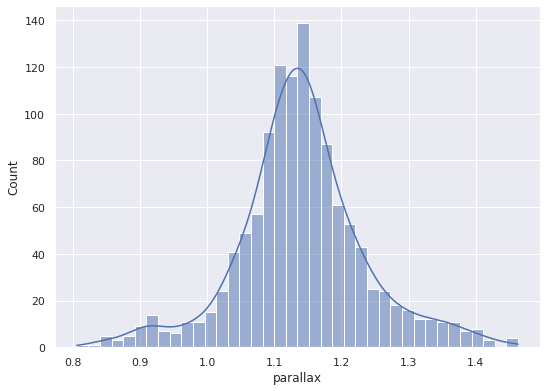

In [ ]:
sns.histplot(member.parallax, kde = True)

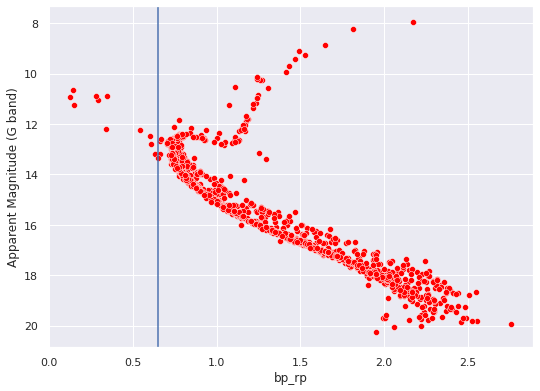

In [ ]:
sns.scatterplot(x = 'bp_rp', y='phot_g_mean_mag', palette='YlOrRd', color = 'red',
                data = member)
plt.ylabel('Apparent Magnitude (G band)')
plt.axvline(0.65)
plt.gca().invert_yaxis()

In [ ]:
member.to_csv("M67_members.csv")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


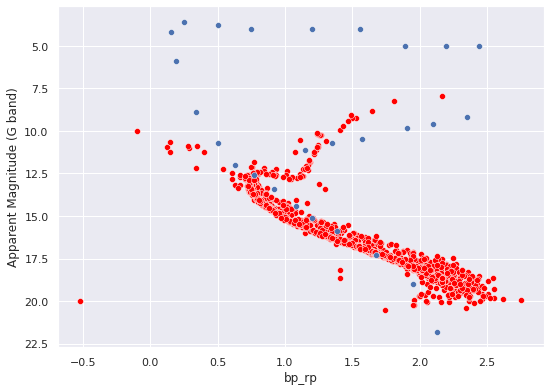

In [ ]:
sns.scatterplot(x = 'bp_rp', y='phot_g_mean_mag', palette='YlOrRd', color = 'red',
                data = all_stars[all_stars.PMemb < 0.4])
plt.ylabel('Apparent Magnitude (G band)')
#plt.xlim(0,3)
sns.scatterplot(hr.b_v+0.5, hr.V+10)

plt.gca().invert_yaxis()

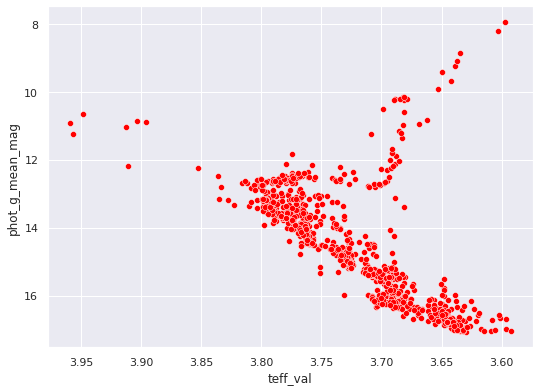

In [ ]:
sns.scatterplot(x = np.log10(member.teff_val), y = member.phot_g_mean_mag, palette='YlOrRd', color = 'red')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


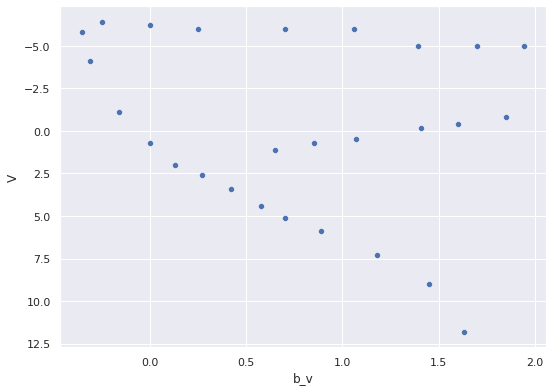

In [ ]:
hr = pd.read_csv('hr.csv')
hr = hr.rename(columns={'Absolute Magnitude': 'V',
                    'b-v':'b_v'})
sns.scatterplot(hr.b_v, hr.V)
plt.gca().invert_yaxis()

0.656 ± 0.005

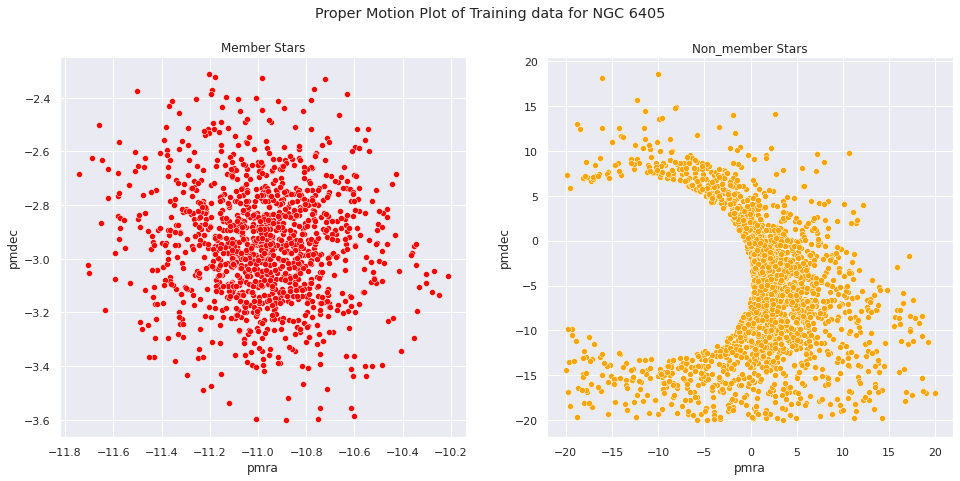

In [ ]:
# proper motion plot marked with the membership probabilities of the stars 

fig, axes = plt.subplots(1, 2, figsize=(16,7))
fig.suptitle('Proper Motion Plot of Training data for NGC 6405 ')

sns.scatterplot(x = 'pmra', y='pmdec', palette='YlOrRd', color = 'red',
                data = member, ax = axes[0])
axes[0].set_title('Member Stars')
#plt.show()
sns.scatterplot(x = 'pmra', y='pmdec', palette='YlOrRd', color = 'orange',
                data = non_member, ax = axes[1])
axes[1].set_title('Non_member Stars')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


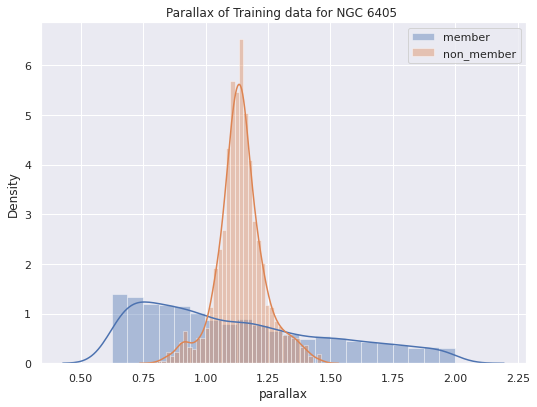

In [ ]:
sns.distplot(member.parallax, label='member')
sns.distplot(non_member.parallax, label = 'non_member')
#plt.xlim(-10,10)
plt.title('Parallax of Training data for NGC 6405 ')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


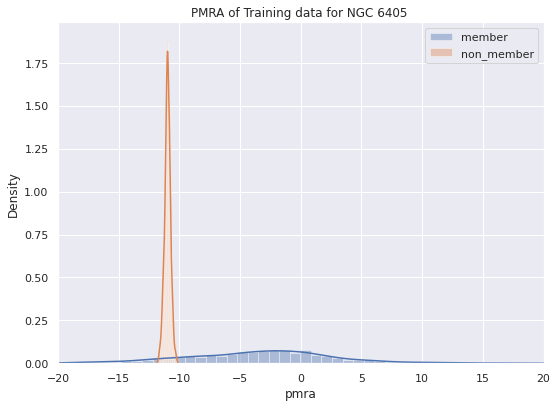

In [ ]:
sns.distplot(member.pmra, label='member')
sns.distplot(non_member.pmra, label = 'non_member')
plt.xlim(-20,20)
plt.title('PMRA of Training data for NGC 6405 ')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


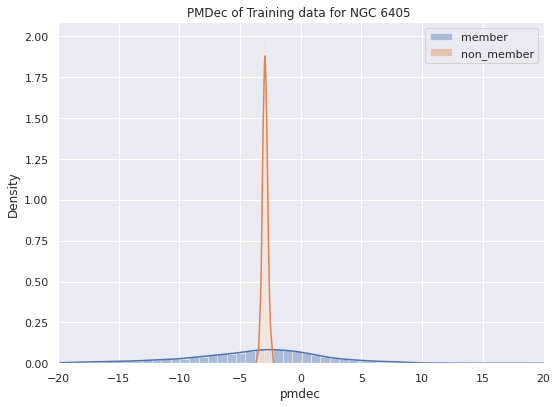

In [ ]:
sns.distplot(member.pmdec, label='member')
sns.distplot(non_member.pmdec, label = 'non_member')
plt.xlim(-20,20)
plt.title('PMDec of Training data for NGC 6405 ')
plt.legend()
plt.show()

In [ ]:
#sns.scatterplot(x='bp_rp', y = 'PMemb', data = all_stars, color = 'black')


In [ ]:
sns.scatterplot(data=training_data, x='pmra', y='pmdec', hue = 'member')

NameError: ignored

## RF Training Start From Here

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


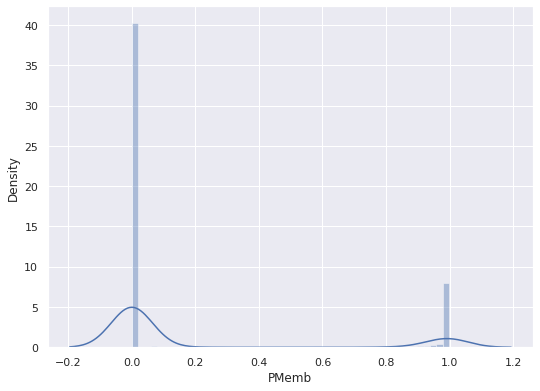

In [ ]:
# histogram of PMemb in the training data
sns.distplot(training_data['PMemb'])
plt.show()

In [ ]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,distance_pc,PMemb,cluster,member
count,3.496000e+03,3.496000e+03,3.496000e+03,3496.0,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.0,3496.000000,3492.000000,3492.000000,3496.000000,3496.000000,3496.000000,...,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,118.000000,118.000000,3496.000000,118.000000,118.000000,118.000000,3496.000000,3496.000000,3496.000000,3496.000000,1515.000000,1515.000000,1515.000000,1515.000000,1210.000000,1210.000000,1210.000000,1210.000000,1210.000000,1210.000000,1481.0,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000
mean,1.635721e+18,6.035680e+17,8.470756e+08,2015.5,132.820133,0.272382,11.807935,0.177325,1.151058,0.341789,13.152143,-3.259345,0.570599,-4.449318,0.380627,-0.312305,-0.226768,-0.269657,0.152064,0.234680,0.284463,-0.678532,0.423813,-0.145060,-0.402256,320.404176,18.123856,318.178204,2.225973,1.409467,401.236176,0.246598,2.475958,31.0,27.231216,1.475722,0.046838,0.040597,36.708810,12.243993,...,40.808004,431.152435,16.409750,1.378994,0.046339,1.486326,0.645774,0.840550,27.445982,1.837470,0.402460,5341.101562,3.394068,-0.074153,215.684831,31.894370,131.953174,-5.614638,100009.026403,5321.023926,5140.703613,5573.405762,0.348964,0.197348,0.546017,0.172106,0.096478,0.269110,200111.0,1.483973,1.368711,1.586292,4.124503,3.852902,4.396105,0.545594,930.082841,0.349837,0.647883,0.352117
std,0.000000e+00,2.940971e+15,4.857702e+08,0.0,0.446576,0.341191,0.435257,0.224542,0.302792,0.420521,13.501383,7.524095,0.709932,6.030164,0.487286,0.126302,0.150523,0.147076,0.155748,0.182435,0.139644,0.088109,0.179155,0.215823,0.120849,46.287711,72.328513,45.947958,2.254068,6.792395,1009.732056,0.579969,33.573983,0.0,64.275696,0.130637,0.055483,0.031016,5.102093,0.844213,...,402.097445,517.818726,2.345260,0.205325,0.210248,0.564813,0.327503,0.283114,21.732673,2.506590,2.275876,687.701294,0.685166,0.298338,0.516390,0.433945,0.441082,0.433411,125.649065,663.880798,640.972168,728.583618,0.314925,0.248014,0.387320,0.156165,0.120686,0.191916,0.0,2.845653,2.667747,3.025699,28.094545,26.327806,29.864248,0.287860,247.345510,0.474633,0.477698,0.477698
min,1.635721e+18,5.986147e+17,2.657300e+04,2015.5,131.805451,0.018080,10.810388,0.011708,0.625557,0.021383,0.274734,-19.999044,0.037657,-19.966204,0.025969,-0.809623,-0.810287,-0.847718,-0.448784,-0.501313,-0.340119,-0.954622

In [ ]:
# Examining the descriptive statistics of each column
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,distance_pc,PMemb,cluster,member
count,3.496000e+03,3.496000e+03,3.496000e+03,3496.0,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.0,3496.000000,3492.000000,3492.000000,3496.000000,3496.000000,3496.000000,...,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000,118.000000,118.000000,3496.000000,118.000000,118.000000,118.000000,3496.000000,3496.000000,3496.000000,3496.000000,1515.000000,1515.000000,1515.000000,1515.000000,1210.000000,1210.000000,1210.000000,1210.000000,1210.000000,1210.000000,1481.0,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,3496.000000,3496.000000,3496.000000,3496.000000,3496.000000
mean,1.635721e+18,6.035680e+17,8.470756e+08,2015.5,132.820133,0.272382,11.807935,0.177325,1.151058,0.341789,13.152143,-3.259345,0.570599,-4.449318,0.380627,-0.312305,-0.226768,-0.269657,0.152064,0.234680,0.284463,-0.678532,0.423813,-0.145060,-0.402256,320.404176,18.123856,318.178204,2.225973,1.409467,401.236176,0.246598,2.475958,31.0,27.231216,1.475722,0.046838,0.040597,36.708810,12.243993,...,40.808004,431.152435,16.409750,1.378994,0.046339,1.486326,0.645774,0.840550,27.445982,1.837470,0.402460,5341.101562,3.394068,-0.074153,215.684831,31.894370,131.953174,-5.614638,100009.026403,5321.023926,5140.703613,5573.405762,0.348964,0.197348,0.546017,0.172106,0.096478,0.269110,200111.0,1.483973,1.368711,1.586292,4.124503,3.852902,4.396105,0.545594,930.082841,0.349837,0.647883,0.352117
std,0.000000e+00,2.940971e+15,4.857702e+08,0.0,0.446576,0.341191,0.435257,0.224542,0.302792,0.420521,13.501383,7.524095,0.709932,6.030164,0.487286,0.126302,0.150523,0.147076,0.155748,0.182435,0.139644,0.088109,0.179155,0.215823,0.120849,46.287711,72.328513,45.947958,2.254068,6.792395,1009.732056,0.579969,33.573983,0.0,64.275696,0.130637,0.055483,0.031016,5.102093,0.844213,...,402.097445,517.818726,2.345260,0.205325,0.210248,0.564813,0.327503,0.283114,21.732673,2.506590,2.275876,687.701294,0.685166,0.298338,0.516390,0.433945,0.441082,0.433411,125.649065,663.880798,640.972168,728.583618,0.314925,0.248014,0.387320,0.156165,0.120686,0.191916,0.0,2.845653,2.667747,3.025699,28.094545,26.327806,29.864248,0.287860,247.345510,0.474633,0.477698,0.477698
min,1.635721e+18,5.986147e+17,2.657300e+04,2015.5,131.805451,0.018080,10.810388,0.011708,0.625557,0.021383,0.274734,-19.999044,0.037657,-19.966204,0.025969,-0.809623,-0.810287,-0.847718,-0.448784,-0.501313,-0.340119,-0.954622

In [ ]:
# Choosing the features

feature_columns = ['parallax',
                   'pmra', 'pmdec']

features = training_data.loc[:,feature_columns]
targets = training_data['member']

In [ ]:
# Dropping the NULL values from the using training set
# adding features and targets in a training set
training_set = pd.concat((features, targets), axis=1)

# dropping NA
training_set = training_set.dropna()

# finding where dtype is float64
float64_data = np.where(training_set.dtypes == 'float64')[0] 

# change the data type to float32 from float64
training_set.iloc[:, float64_data] = training_set.iloc[:, float64_data].astype('float32')


# set features, targets again
features, targets = training_set.iloc[:,:-1], training_set.iloc[:,-1]

features.describe()

,parallax,pmra,pmdec
count,3496.000000,3496.000000,3496.000000
mean,1.151058,-3.259339,-4.449317
std,0.302792,7.524096,6.030166
min,0.625557,-19.999044,-19.966204
25%,0.956051,-10.913007,-7.413913
50%,1.128148,-1.414218,-3.071736
75%,1.279475,2.266405,-2.592435
max,1.997453,19.932800,18.545561


In [ ]:
targets.value_counts()

0    2265
1    1231
Name: member, dtype: int64

In [ ]:
from mpl_toolkits.mplot3d import Axes3D


ax = plt.figure().gca(projection='3d')

ax.scatter(member.pmra, member.pmdec, member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('member stars in the 3D space')
plt.show()


In [ ]:
ax = plt.figure().gca(projection='3d')

ax.scatter(non_member.pmra, non_member.pmdec, non_member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('non-member stars in the 3D space')
plt.show()


#### Check Feature Importance using Random Forest

In [ ]:
# Use Random Forest on whole dataset using 100 different trees 
rfc = RandomForestClassifier(n_estimators = 100, oob_score = True)
rfc.fit(features, targets)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=True, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# checking the feature importance, 
# ( this is higher for a variable if the model efficiency become lower as we remove that variable)
feature_imp = pd.Series(rfc.feature_importances_, index=features.columns).sort_values(ascending = False)
feature_imp

pmra        0.623874
pmdec       0.292316
parallax    0.083810
dtype: float64

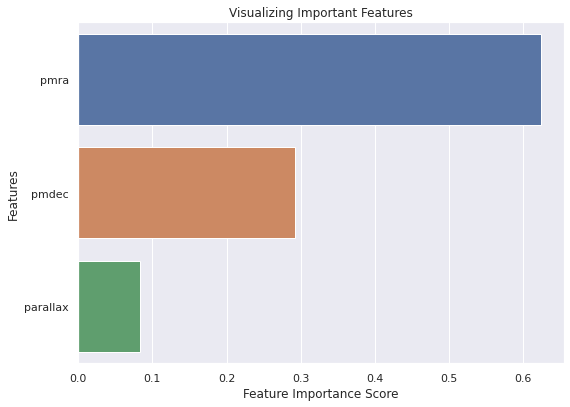

In [ ]:
# plotting as a barplot

# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

### Model Selection and Accuracy Estimate using Test Data

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, classification_report

In [ ]:
from sklearn.model_selection import train_test_split
# splitting our dataset using 0.3 test ratio (30% test data, 70% train data)
train_features, test_features, train_targets, test_targets = train_test_split(features, 
                                                                                targets, 
                                                                                test_size = 0.3, 
                                                                                random_state=258)

In [ ]:
def evaluate_model(model):
    test_predict = model.predict(test_features)
    train_predict = model.predict(train_features)

    print('Model Accuracy:')
    print("Precision on training data: %.3f" % precision_score(train_targets, train_predict))
    print("Precision on testing data: %.3f" % precision_score(test_targets, test_predict))
    print('Accuracy on test data: %.3f' % accuracy_score(test_targets, test_predict))


    sns.heatmap(confusion_matrix(test_targets, test_predict), cmap= 'Greens', annot = True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

    print("Classification Report: \n", classification_report(test_targets, test_predict))

#### Random Forest

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
max_features = ['auto', 'sqrt']
# Maximum number of levels
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
ccp_alpha = [2**i for i in range(-10,0)]+[0]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'ccp_alpha': ccp_alpha}

random_grid

{'bootstrap': [True, False],
 'ccp_alpha': [0.0009765625,
  0.001953125,
  0.00390625,
  0.0078125,
  0.015625,
  0.03125,
  0.0625,
  0.125,
  0.25,
  0.5,
  0],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]}

In [ ]:
rfc = RandomForestClassifier(random_state = 42,
                                    oob_score = True)

rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, 
                               n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1,
                               scoring = 'precision')

In [ ]:
rfc_random.fit(train_features, train_targets)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  5.6min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rfc_random.best_params_


{'bootstrap': True,
 'ccp_alpha': 0,
 'max_depth': 30,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


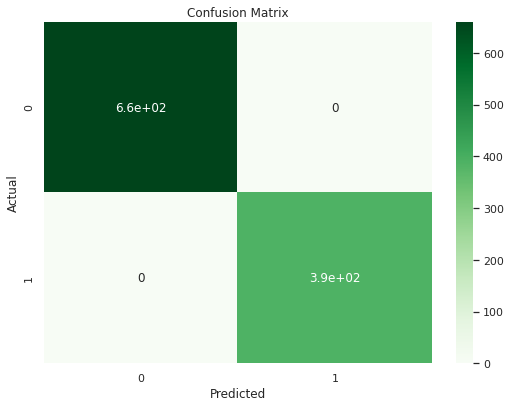

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       659
           1       1.00      1.00      1.00       390

    accuracy                           1.00      1049
   macro avg       1.00      1.00      1.00      1049
weighted avg       1.00      1.00      1.00      1049



In [ ]:
base_model = RandomForestClassifier(n_estimators = 100, random_state = 42,
                                    oob_score = True)
base_model.fit(train_features, train_targets)

evaluate_model(base_model)


Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


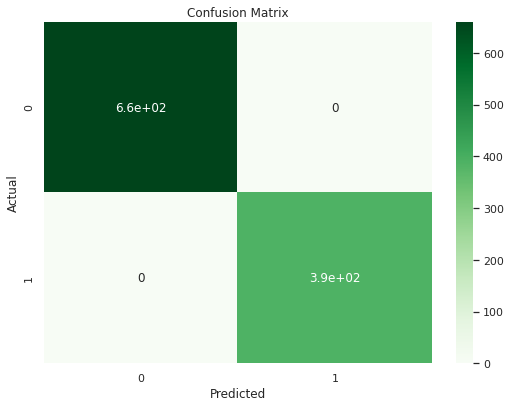

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       659
           1       1.00      1.00      1.00       390

    accuracy                           1.00      1049
   macro avg       1.00      1.00      1.00      1049
weighted avg       1.00      1.00      1.00      1049



In [ ]:
best_random = rfc_random.best_estimator_

evaluate_model(best_random)


### Prediction for the new stars

In [ ]:
# descriptive stats
# chosing only GAIA stars close to 2.5 degree radius of the center

GAIA_target_stars = r.to_pandas()

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars['parallax'] >= 0]

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars.loc[:, 'bp_rp'].notnull()]

GAIA_target_stars = GAIA_target_stars[(abs(GAIA_target_stars['pmra']) < 20) & (abs(GAIA_target_stars['pmdec']) < 20)]

GAIA_target_stars.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist
count,7.111700e+04,7.111700e+04,7.111700e+04,71117.0,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,7.111700e+04,71117.000000,71117.000000,71117.0,71117.000000,71037.000000,71037.000000,71117.000000,71117.000000,71117.000000,...,71117.000000,71117.000000,71117.000000,7.111700e+04,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,71117.000000,1153.000000,1153.000000,71117.000000,1153.000000,1153.000000,1153.000000,71117.000000,71117.000000,71117.000000,71117.000000,19112.000000,19112.000000,19112.000000,19112.000000,14794.000000,14794.000000,14794.000000,14794.000000,14794.000000,14794.000000,14344.0,14344.000000,14344.000000,14344.000000,14344.000000,14344.000000,14344.000000,71117.000000
mean,1.635721e+18,6.030829e+17,8.490829e+08,2015.5,132.739129,0.356889,11.763627,0.238512,1.040959,0.442389,7.281761,-3.015228,0.733643,-3.652374,0.487704,-0.347525,-0.221422,-0.261391,0.171604,0.224274,0.273478,-0.671957,0.438606,-0.148453,-0.406854,304.203721,6.441132,302.224461,1.979260,1.917708,4.660726e+02,0.351523,4.595883,31.0,10.863352,1.467873,0.060890,0.025625,34.884880,11.976785,...,153.567749,18.794359,32.721571,2.379147e+04,46.919135,243.882812,17.292068,1.403445,0.016086,1.502358,0.641544,0.860822,22.787591,1.341240,0.202835,5395.013184,3.647008,-0.095620,215.690390,31.797604,131.887891,-5.675376,100021.899226,5347.791504,5160.835938,5624.782715,0.347750,0.201093,0.544537,0.172450,0.099472,0.269988,200111.0,1.529344,1.410178,1.628143,4.413292,3.909843,4.916773,1.629027
std,0.000000e+00,3.775102e+15,4.885419e+08,0.0,1.254003,0.372676,1.234351,0.254682,0.896523,0.458091,12.634926,5.806087,0.752689,5.413675,0.531269,0.152499,0.174455,0.173836,0.193701,0.203432,0.175539,0.116285,0.176336,0.214899,0.132660,64.246085,43.757783,63.846605,2.330201,8.801694,5.198631e+03,0.704135,106.385415,0.0,41.864685,0.143541,0.060196,0.047886,7.257529,1.254727,...,266.052704,2.213539,7.285342,9.796838e+05,2734.193123,367.317017,1.924931,0.229387,0.125808,0.585022,0.343289,0.295820,33.334072,1.703285,1.660677,647.268188,0.714333,0.334495,1.450394,1.229605,1.233295,1.234711,203.193592,669.496338,642.858887,745.665222,0.350528,0.275731,0.429574,0.174843,0.136857,0.215013,0.0,2.989052,2.781025,3.178261,32.307995,28.902920,35.810642,0.620458
min,1.635721e+18,5.972675e+17,2.351200e+04,2015.5,130.271411,0.016709,9.302038,0.010515,0.

In [ ]:
GAIA_target_stars = GAIA_target_stars.dropna(subset = feature_columns)


In [ ]:
# select the set of predictor variables from the new dataset
new_features = GAIA_target_stars.loc[:, feature_columns]
new_features = new_features.astype('float32')

In [ ]:
# train the model again using all the features and targets of the previous dataset
# rfc.fit(features, targets)

In [ ]:
# estimate the membership classification of the stars
GAIA_target_stars['member'] = best_random.predict(new_features)
GAIA_target_stars['member'].value_counts()

0    68973
1     2144
Name: member, dtype: int64

In [ ]:
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = best_random.predict_proba(new_features)[:,1]
sum(GAIA_target_stars['PMemb'] >= 0.6), sum(GAIA_target_stars['PMemb'] >= 0.8)

(1768, 1444)

In [ ]:
potentialMember = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6]
len(potentialMember)

1768

In [ ]:
potentialMember.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,member,PMemb
count,1.768000e+03,1.768000e+03,1.768000e+03,1768.0,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.0,1768.000000,1767.000000,1767.000000,1768.000000,1768.00000,1768.000000,...,1768.000000,1.768000e+03,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,1768.000000,93.000000,93.000000,1768.000000,93.000000,93.000000,93.000000,1768.000000,1768.000000,1768.000000,1768.000000,1099.000000,1099.000000,1099.000000,1099.000000,858.000000,858.000000,858.000000,858.000000,858.000000,858.000000,1084.0,1084.000000,1084.000000,1084.000000,1084.000000,1084.000000,1084.000000,1768.000000,1768.0,1768.000000
mean,1.635721e+18,6.039719e+17,8.304716e+08,2015.5,132.842885,0.124416,11.797158,0.082927,1.112119,0.157170,18.503008,-11.008267,0.261222,-2.616839,0.178290,-0.305652,-0.217468,-0.230618,0.123512,0.205300,0.260151,-0.654997,0.396590,-0.102135,-0.404167,317.911199,29.178733,315.795249,2.115950,0.786541,345.720306,0.112376,0.742324,31.0,42.482754,1.490352,0.022237,0.036285,36.29129,12.323529,...,34.680995,5.709730e+04,56.396049,623.111938,15.317241,1.317565,0.072398,1.428361,0.651277,0.777085,34.469482,2.153563,0.589932,5330.645020,3.392473,-0.056452,215.706901,31.909263,131.977624,-5.618601,100004.755232,5350.660645,5167.249512,5597.153320,0.369547,0.210924,0.573269,0.182615,0.103254,0.282640,200111.0,1.520291,1.405007,1.628580,4.143457,3.887502,4.399408,0.578180,1.0,0.940094
std,0.000000e+00,2.625030e+15,4.815838e+08,0.0,0.582058,0.168489,0.606382,0.118156,0.169580,0.210171,13.413493,0.341856,0.356378,1.017980,0.252386,0.106176,0.133968,0.133174,0.141493,0.165229,0.122765,0.086991,0.160980,0.193185,0.099505,39.040987,89.603868,38.781744,2.389994,4.346476,278.222626,0.279759,7.737620,0.0,75.814873,0.113215,0.029394,0.033522,4.38840,0.806363,...,4.856869,4.554204e+05,497.898321,550.619934,2.123412,0.142028,0.259219,0.566743,0.309646,0.269293,5.292153,2.831532,2.680042,691.722473,0.706528,0.258363,0.710969,0.572532,0.578253,0.601009,85.275879,679.483765,650.873352,741.743958,0.312324,0.249817,0.379166,0.155359,0.121986,0.188953,0.0,2.792919,2.626160,2.978032,26.497107,24.970394,28.024792,0.598475,0.0,0.112206
min,1.635721e+18,5.972877e+17,1.427216e+06,2015.5,130.396966,0.018080,9.365995,0.011963,0.127103,0.021383,0.170333,-13.351549,0.037657,-3.586399,0.025969,-0.795347,-0.810287,-0.686745,-0.498955,-0.455329,-0.340119,-0.907704,-0.264747,-0.56

In [ ]:
member.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,distance_pc,PMemb,cluster
count,1.231000e+03,1.231000e+03,1.231000e+03,1231.0,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1.231000e+03,1231.0,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,...,1.231000e+03,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,82.000000,82.000000,1231.000000,82.000000,82.000000,82.000000,1231.000000,1231.000000,1231.000000,1231.000000,911.000000,911.000000,911.000000,911.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,902.0,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,1231.000000,1231.000000,1231.000000,1231.0
mean,1.635721e+18,6.042323e+17,8.388070e+08,2015.5,132.853144,0.075934,11.830306,0.049756,1.140266,0.095872,22.000330,-10.978997,0.159400,-2.945037,0.109393,-0.296830,-0.213990,-0.222861,0.110741,0.200089,0.254192,-0.649386,0.383504,-0.089136,-0.403831,319.308692,37.006499,317.137287,2.171405,0.553792,338.714905,0.060765,5.177222e-01,31.0,53.360119,1.514697,0.013744,0.038345,36.428107,12.393989,...,7.380409e+04,72.381588,740.789429,14.749632,1.281802,0.089358,1.302285,0.589478,0.712808,34.505410,2.155969,0.745735,5323.170898,3.335366,-0.054878,215.677067,31.933622,131.978378,-5.584635,100005.511526,5365.866211,5178.138672,5613.407227,0.373059,0.211701,0.579853,0.184645,0.103821,0.285931,200111.0,1.573695,1.453352,1.688593,4.491678,4.218505,4.764853,0.310592,883.363798,0.993525,0.0
std,0.000000e+00,2.102937e+15,4.803834e+08,0.0,0.275686,0.084938,0.269249,0.056206,0.096032,0.107487,12.776447,0.244051,0.176785,0.215855,0.122464,0.098232,0.123147,0.127456,0.133386,0.150395,0.112593,0.081800,0.152170,0.182362,0.094992,31.513072,99.476647,31.318685,2.473737,4.166090,181.774200,0.171235,2.885827e+00,0.0,82.185661,0.098964,0.015466,0.031197,3.471298,0.664987,...,5.405991e+05,594.597866,550.997375,1.924333,0.099137,0.285376,0.517202,0.282670,0.238141,4.115519,2.916873,2.983616,708.728394,0.689672,0.269386,0.325505,0.262642,0.275854,0.264431,93.653369,677.439209,651.408569,739.590149,0.308255,0.244847,0.376100,0.153362,0.119635,0.187205,0.0,2.992034,2.810149,3.194196,28.815269,27.156487,30.474993,0.224591,76.713059,0.008692,0.0
min,1.635721e+18,5.986167e+17,1.427216e+06,2015.5,131.872333,0.018080,10.889397,0.011963,0.805691,0.021383,1.531933,-11.743605,0.037657,-3.600932,0.025969,-0.795347,-0.810287,-0.644119,-0.448784,-0.293585,-0.340119,-0.907704,-0.127192,-0

#### Visualization

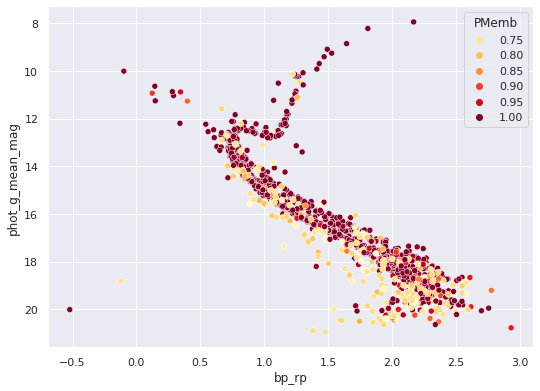

In [ ]:
# CMD of predicted members 

cmd = sns.scatterplot(x = 'bp_rp', y = 'phot_g_mean_mag', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.7] )
cmd.invert_yaxis()

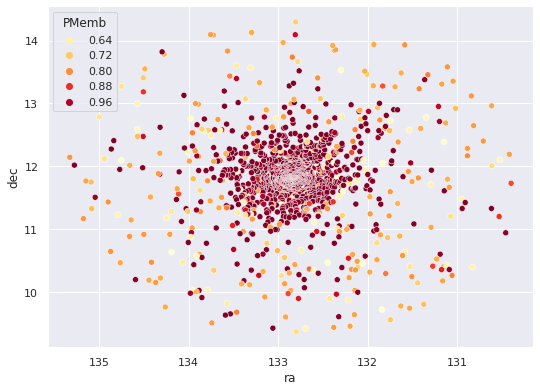

In [ ]:
skyplot = sns.scatterplot(x = 'ra', y = 'dec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
skyplot.invert_xaxis()
plt.show()


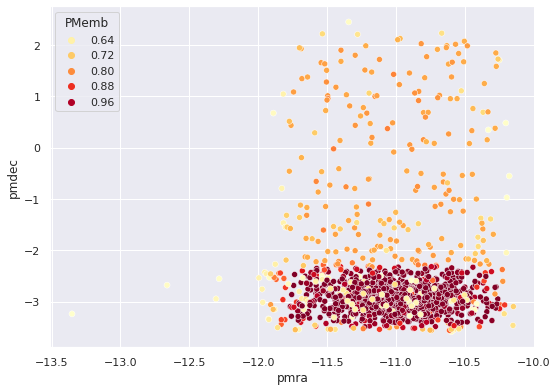

In [ ]:
# pm plot
sns.scatterplot(x = 'pmra', y = 'pmdec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
plt.show()


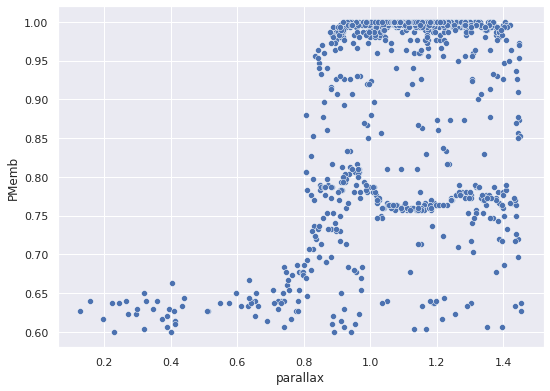

In [ ]:
# parallax plot
sns.scatterplot(x = 'parallax', y = 'PMemb',  
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )

In [ ]:
# saving the files as csv
# all_stars.to_csv('gaia_6405_membership_prob.csv')

potentialMember.to_csv('M_67_membership_prob.csv')


### Comparing the old and new predicted members

In [ ]:
# creating subset for the potential member in previous dataset

concatenated = pd.concat([potentialMember.assign(dataset='New_member'), member.assign(dataset='Old_member')])


In [ ]:
concatenated.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,member,PMemb,distance_pc,cluster
count,2.999000e+03,2.999000e+03,2.999000e+03,2999.0,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2.999000e+03,2999.0,2999.000000,2998.000000,2998.000000,2999.000000,2999.000000,2999.000000,...,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,2999.000000,175.000000,175.000000,2999.000000,175.000000,175.000000,175.000000,2999.000000,2999.000000,2999.000000,2999.000000,2010.000000,2010.000000,2010.000000,2010.000000,1570.000000,1570.000000,1570.000000,1570.000000,1570.000000,1570.000000,1986.0,1986.000000,1986.000000,1986.000000,1986.000000,1986.000000,1986.000000,2999.000000,1768.0,2999.000000,1231.000000,1231.0
mean,1.635721e+18,6.040788e+17,8.338931e+08,2015.5,132.847096,0.104516,11.810764,0.069312,1.123673,0.132009,19.938538,-10.996252,0.219427,-2.751554,0.150010,-0.302031,-0.216041,-0.227434,0.118270,0.203162,0.257706,-0.652693,0.391219,-0.096799,-0.404029,318.484828,32.391797,316.346115,2.138713,0.691005,342.844482,0.091191,6.501315e-01,31.0,46.947559,1.500348,0.018750,0.037131,36.347449,12.352451,...,62.957636,671.415222,15.084253,1.302884,0.079360,1.376612,0.625911,0.750701,34.486317,2.154690,0.653885,5327.143066,3.365714,-0.055714,215.694655,31.919261,131.977934,-5.604659,100005.098010,5357.553223,5172.185059,5604.517578,0.371139,0.211277,0.576255,0.183535,0.103511,0.284133,200111.0,1.544545,1.426964,1.655838,4.301616,4.037839,4.565391,0.468343,1.0,0.962026,883.363798,0.0
std,0.000000e+00,2.427380e+15,4.810288e+08,0.0,0.480509,0.142341,0.496717,0.098949,0.144654,0.178000,13.265656,0.305816,0.300313,0.809918,0.211768,0.103064,0.129626,0.130891,0.138343,0.159302,0.118712,0.084930,0.157530,0.188895,0.097662,36.142171,93.845008,35.907072,2.424462,4.274189,243.293274,0.242494,6.222248e+00,0.0,78.661163,0.108240,0.024995,0.032598,4.037184,0.752239,...,539.652474,553.718201,2.062707,0.127401,0.270345,0.550369,0.300362,0.258861,4.763744,2.863541,2.809182,697.732788,0.697262,0.262824,0.584474,0.470790,0.477807,0.491795,89.148624,678.431213,650.976807,740.628113,0.310391,0.247497,0.377673,0.154411,0.120888,0.188110,0.0,2.884443,2.710687,3.077453,27.567629,25.979965,29.156244,0.499131,0.0,0.090237,76.713059,0.0
min,1.635721e+18,5.972877e+17,1.427216e+06,2015.5,130.396966,0.018080,9.365995,0.011963,0.127103,0.021383,0.170333,-13.351549,0.037657,-3.600932,0.025969,-0.795347,-0.810287,-0.686745,-0.498955,-0.455329,-0.340119,-0.907704,-0.264747,-0.569143,-0.771

In [ ]:
member.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,...,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,distance_pc,PMemb,cluster
count,1.231000e+03,1.231000e+03,1.231000e+03,1231.0,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1.231000e+03,1231.0,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,...,1.231000e+03,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000,82.000000,82.000000,1231.000000,82.000000,82.000000,82.000000,1231.000000,1231.000000,1231.000000,1231.000000,911.000000,911.000000,911.000000,911.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,902.0,902.000000,902.000000,902.000000,902.000000,902.000000,902.000000,1231.000000,1231.000000,1231.000000,1231.0
mean,1.635721e+18,6.042323e+17,8.388070e+08,2015.5,132.853144,0.075934,11.830306,0.049756,1.140266,0.095872,22.000330,-10.978997,0.159400,-2.945037,0.109393,-0.296830,-0.213990,-0.222861,0.110741,0.200089,0.254192,-0.649386,0.383504,-0.089136,-0.403831,319.308692,37.006499,317.137287,2.171405,0.553792,338.714905,0.060765,5.177222e-01,31.0,53.360119,1.514697,0.013744,0.038345,36.428107,12.393989,...,7.380409e+04,72.381588,740.789429,14.749632,1.281802,0.089358,1.302285,0.589478,0.712808,34.505410,2.155969,0.745735,5323.170898,3.335366,-0.054878,215.677067,31.933622,131.978378,-5.584635,100005.511526,5365.866211,5178.138672,5613.407227,0.373059,0.211701,0.579853,0.184645,0.103821,0.285931,200111.0,1.573695,1.453352,1.688593,4.491678,4.218505,4.764853,0.310592,883.363798,0.993525,0.0
std,0.000000e+00,2.102937e+15,4.803834e+08,0.0,0.275686,0.084938,0.269249,0.056206,0.096032,0.107487,12.776447,0.244051,0.176785,0.215855,0.122464,0.098232,0.123147,0.127456,0.133386,0.150395,0.112593,0.081800,0.152170,0.182362,0.094992,31.513072,99.476647,31.318685,2.473737,4.166090,181.774200,0.171235,2.885827e+00,0.0,82.185661,0.098964,0.015466,0.031197,3.471298,0.664987,...,5.405991e+05,594.597866,550.997375,1.924333,0.099137,0.285376,0.517202,0.282670,0.238141,4.115519,2.916873,2.983616,708.728394,0.689672,0.269386,0.325505,0.262642,0.275854,0.264431,93.653369,677.439209,651.408569,739.590149,0.308255,0.244847,0.376100,0.153362,0.119635,0.187205,0.0,2.992034,2.810149,3.194196,28.815269,27.156487,30.474993,0.224591,76.713059,0.008692,0.0
min,1.635721e+18,5.986167e+17,1.427216e+06,2015.5,131.872333,0.018080,10.889397,0.011963,0.805691,0.021383,1.531933,-11.743605,0.037657,-3.600932,0.025969,-0.795347,-0.810287,-0.644119,-0.448784,-0.293585,-0.340119,-0.907704,-0.127192,-0

In [ ]:
concatenated.dataset.value_counts()

New_member    1768
Old_member    1231
Name: dataset, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

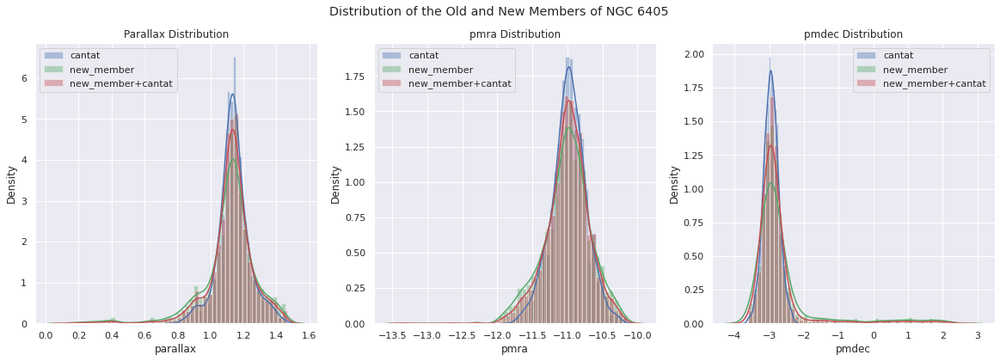

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Distribution of the Old and New Members of NGC 6405')


sns.distplot(member['parallax'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[0])
sns.distplot(potentialMember['parallax'], color = 'g', label = 'new_member', 
             kde=True, ax=axes[0])
sns.distplot(concatenated['parallax'], color = 'r', ax=axes[0], kde=True,
             label = 'new_member+cantat')
axes[0].set_title('Parallax Distribution')
axes[0].legend()

sns.distplot(member['pmra'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[1])
sns.distplot(potentialMember['pmra'], color = 'g', label = 'new_member', 
             kde=True, ax=axes[1])
sns.distplot(concatenated['pmra'], color = 'r', ax=axes[1], kde=True,
             label = 'new_member+cantat')
axes[1].set_title('pmra Distribution')
axes[1].legend()

sns.distplot(member['pmdec'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[2])
sns.distplot(potentialMember['pmdec'], color = 'g', label = 'new_member', 
             kde=True, ax=axes[2])
sns.distplot(concatenated['pmdec'], color = 'r', ax=axes[2], kde=True,
             label = 'new_member+cantat')
axes[2].set_title('pmdec Distribution')
axes[2].legend()

plt.show()


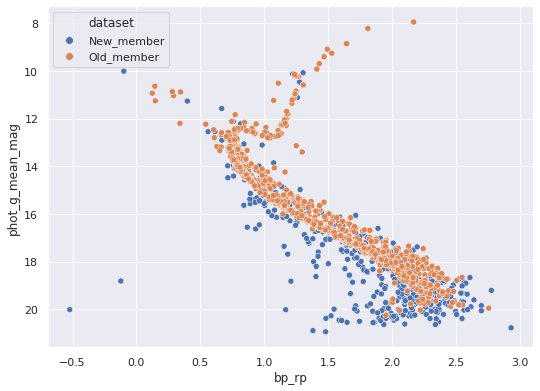

In [ ]:
cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset')
cmd.invert_yaxis()

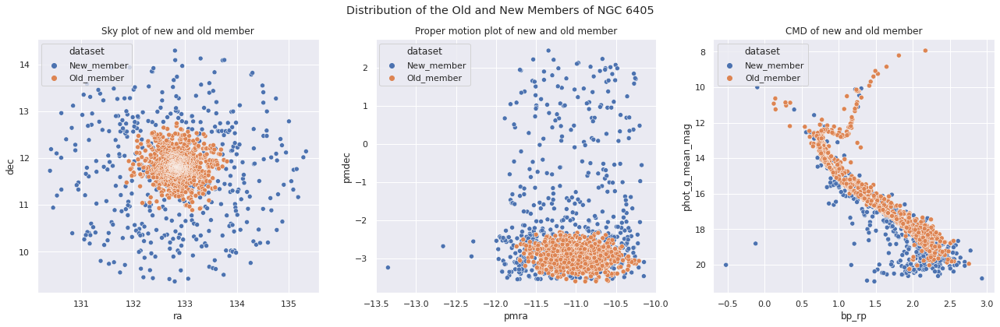

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(22,6))
fig.suptitle('Distribution of the Old and New Members of NGC 6405')

skyplot = sns.scatterplot(x='ra', y='dec', data=concatenated,
                hue='dataset', ax=axes[0])
axes[0].set_title('Sky plot of new and old member')

# proper motion plot
sns.scatterplot(x='pmra', y='pmdec', data=concatenated,
                hue='dataset', ax=axes[1])
axes[1].set_title('Proper motion plot of new and old member')

cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset', ax=axes[2])
cmd.invert_yaxis()
axes[2].set_title('CMD of new and old member')

plt.show()

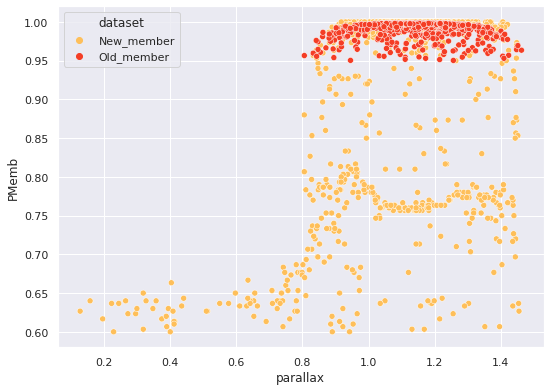

In [ ]:
# parallax vs PMemb plot
sns.scatterplot(x = 'parallax', y = 'PMemb',  hue = 'dataset',
                      palette='YlOrRd', data = concatenated )

In [ ]:
# pd_prof.ProfileReport(potentialMember)

In [ ]:
#files.download('M_67_cantat.csv')

#files.download('M_67_membership_prob.csv')

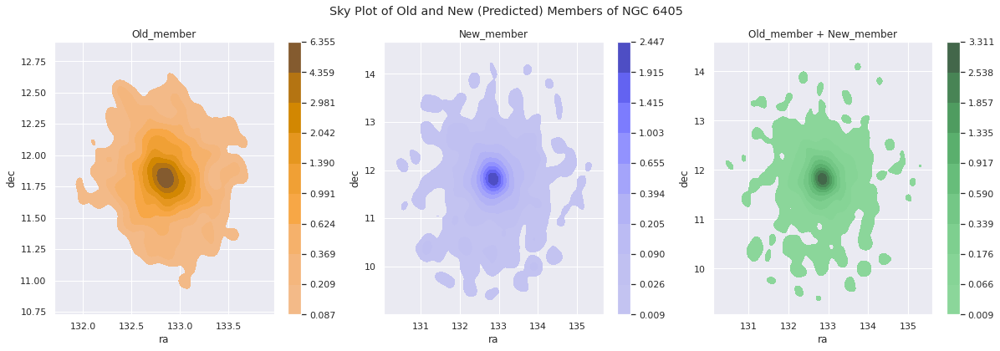

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Sky Plot of Old and New (Predicted) Members of NGC 6405')

sns.kdeplot(x='ra', y='dec', data = member, shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

sns.kdeplot(x='ra', y='dec', data = potentialMember, shade=True, color = 'blue', 
            bw_method = 0.20, cbar=True, ax=axes[1])
axes[1].set_title('New_member')

sns.kdeplot(x='ra', y='dec', data = concatenated, shade=True, color = 'g', 
            bw_method = 0.20, cbar=True, ax=axes[2])
axes[2].set_title('Old_member + New_member')

plt.show()

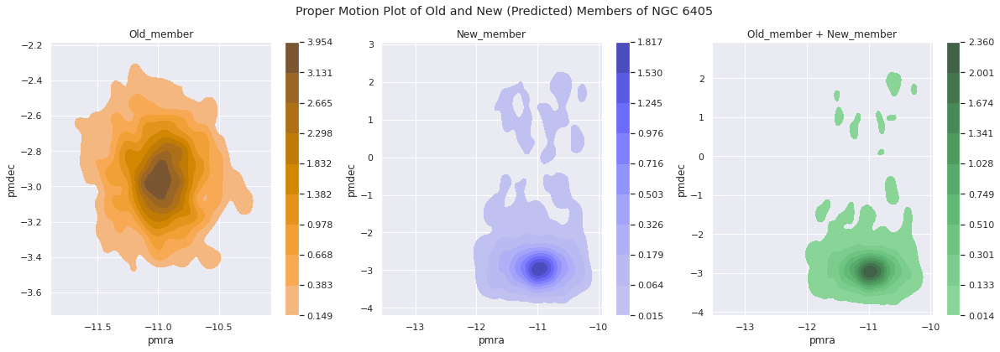

In [ ]:

fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Proper Motion Plot of Old and New (Predicted) Members of NGC 6405')

sns.kdeplot(x='pmra', y='pmdec', data = member, shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

sns.kdeplot(x='pmra', y='pmdec', data = potentialMember, shade=True, color = 'blue', 
            bw_method = 0.20, cbar=True, ax=axes[1])
axes[1].set_title('New_member')

sns.kdeplot(x='pmra', y='pmdec', data = concatenated, shade=True, color = 'g', 
            bw_method = 0.20, cbar=True, ax=axes[2])
axes[2].set_title('Old_member + New_member')

plt.show()

In [ ]:
from google.colab import files

In [ ]:
#files.download('M_67_cantat.csv')

potentialMember.to_csv('M_67_additional_member_prob.csv')
concatenated.to_csv('M_67_all_member_prob.csv')

#files.download('M_67_all_member_prob.csv')
# column 'dataset': Old_member, New_member
# column 'member': 0 and 1
# column 'PMemb': decimal values between 0 to 1

files.download('M_67_additional_member_prob.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>